#### **Machine Learning and Data Science Research Project - Research (Vectorized)**

**Project:** Reinforcement Learning for Optimal Execution - GPU Accelerated Version

**Author:** Robert de Witt (CID: 02541719)

**Note:** This is a vectorized version optimized for GPU acceleration and faster training.


In [1]:
import time                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 
import pandas as pd
from notebook_logging_setup import quick_setup
from stable_baselines3 import PPO
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
from stable_baselines3.common.vec_env import VecNormalize
from tqdm import tqdm
import torch
import torch.nn as nn
import numpy as np
import random
import gc
import psutil
import tqdm

# my libraries
from mkt_data_mana import ManaMarketDataLoader as mmdl
import render_plots as rp
import model_parking as mp
from optimal_execution_env_vectorized import VectorizedMultiOrderExecutionEnv
from order_generator import OrderGenerator
from quote_and_trade_analytics import QuoteAndTradeAnalytics
import baseline_strategies as bs
import gpu_utils
from custom_tensorboard_callback import create_training_callbacks
from propagator_param_loader import PropagatorParamLoader
from cost_models import StandardExecutionCostModel
import ppo_optimizer as po


quick_setup(debug=False)
fixed_seed = 42
np.random.seed(fixed_seed)
random.seed(fixed_seed)  # Also seed the random module  

device = gpu_utils.get_torch_device()
gpu_utils.set_random_seed(fixed_seed)

print(f"Using device: {device}")
print(f"GPU Memory Available: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB" if device == 'cuda' else "")
print(f"MPS Available: {torch.backends.mps.is_available()}" if device == 'mps' else "")

# Vectorized environment configuration
max_trading_rate = 0.8
max_order_size_in_adv_pct = 0.1
num_vec_envs_gpu = 64 
num_vec_envs_cpu_train = 64
num_vec_envs_cpu_test = 512

print(f"Vectorized configuration:")
print(f"  - Num vectorized environments: GPU: {num_vec_envs_gpu} and CPU train: {num_vec_envs_cpu_train} and CPU test: {num_vec_envs_cpu_test}")
print(f"  - Device: {device}")
print(f"  - Max trading rate: {max_trading_rate}")
print(f"  - Max order size (ADV %): {max_order_size_in_adv_pct}")

2025-08-30 19:09:42.092887: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-30 19:09:42.102526: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756577382.116600    1530 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756577382.120508    1530 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1756577382.130430    1530 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

Logging configured at INFO level
2025-08-30 19:09:44 - root - INFO - Using CUDA GPU: NVIDIA GeForce RTX 4090
2025-08-30 19:09:44 - root - INFO - CUDA Device Count: 1
2025-08-30 19:09:44 - root - INFO - Current CUDA Device: 0
Using device: cuda
GPU Memory Available: 24.0 GB

Vectorized configuration:
  - Num vectorized environments: GPU: 64 and CPU train: 64 and CPU test: 512
  - Device: cuda
  - Max trading rate: 0.8
  - Max order size (ADV %): 0.1


In [2]:
# Stock selection - optimized for vectorized processing
tickers = None
#tickers = ['MSFT','GOOGL']

# Load market data with progress tracking
print("\nLoading market data...")
start_time = time.time()
md = mmdl(load_data=True)
load_time = time.time() - start_time
print(f"Data loaded in {load_time:.2f} seconds")

# Check available dates
print(f"Available dates: {md.start_date} to {md.end_date}")


all_stock_list = md.all_stock_list                                                      

if tickers is None:
    tickers = all_stock_list

# Check available symbols, wrap 15 symbols per row
print(f"Available symbols sample[0:15], total {len(all_stock_list)}:")
print(f"[(1:15)]{all_stock_list[0:15]},")

# get dataframe with market data
processing_time = time.time() - start_time
print(f"Data finished processing in {processing_time:.2f} seconds")


Loading market data...
Data loaded in 1.61 seconds
Available dates: 2022-01-03 to 2022-12-30
Available symbols sample[0:15], total 402:
[(1:15)]['A', 'AAL', 'AAP', 'AAPL', 'ABBV', 'ABT', 'ACGL', 'ACN', 'ADBE', 'ADI', 'ADM', 'ADP', 'ADSK', 'AEE', 'AEP'],
Data finished processing in 17.99 seconds


In [3]:
# Create train/test split using date filtering with larger batches for vectorized processing
start_time = time.time()

train_stock_df_list = md.to_pandas_dict_fast(start_pct=0.0, end_pct=0.7)
test_stock_df_list = md.to_pandas_dict_fast(start_pct=0.71, end_pct=1.0)
print(f"to_pandas_dict time: {time.time() - start_time:0.2f} seconds")
print(f"train_stock_df_list: {train_stock_df_list.keys()}")
# print head of train_stock_df_list in a nicer format, show all columns in one line
print(f"train_stock_df_list: {train_stock_df_list[tickers[0]].head(2).to_string(index=False)}")
print(f"train_stock_df_list: {train_stock_df_list[tickers[1]].head(2).to_string(index=False)}")
print(f"train_stock_df_list time: {time.time() - start_time:0.2f} seconds")

2025-08-30 19:10:26 - mkt_data_mana - INFO - start_date: 2022-01-03, end_date: 2022-09-13, num_dates: 165
2025-08-30 19:10:26 - mkt_data_mana - INFO - Loaded data for 393 symbols: ['A', 'AAL', 'AAP', 'AAPL', 'ABBV', 'ABT', 'ACN', 'ADBE', 'ADI', 'ADM']...
2025-08-30 19:10:45 - mkt_data_mana - INFO - start_date: 2022-09-16, end_date: 2022-12-30, num_dates: 71
2025-08-30 19:10:45 - mkt_data_mana - INFO - Loaded data for 394 symbols: ['A', 'AAL', 'AAP', 'AAPL', 'ABBV', 'ABT', 'ACGL', 'ACN', 'ADBE', 'ADI']...
to_pandas_dict time: 45.12 seconds
train_stock_df_list: dict_keys(['A', 'AAL', 'AAP', 'AAPL', 'ABBV', 'ABT', 'ACN', 'ADBE', 'ADI', 'ADM', 'ADP', 'ADSK', 'AEE', 'AEP', 'AES', 'AFL', 'AJG', 'AKAM', 'ALB', 'ALGN', 'ALK', 'AMAT', 'AMCR', 'AMD', 'AME', 'AMGN', 'AMP', 'AMT', 'AMZN', 'ANET', 'ANSS', 'AON', 'AOS', 'APA', 'APD', 'APH', 'ARE', 'ATO', 'ATVI', 'AVB', 'AVGO', 'AWK', 'AXP', 'BA', 'BALL', 'BAX', 'BBWI', 'BBY', 'BDX', 'BEN', 'BIIB', 'BK', 'BKNG', 'BKR', 'BLK', 'BMY', 'BRO', 'BWA', 'BX

**Order Generation**

The order generation process creates a set of trading orders with the following characteristics:
1.  For each order, a random stock is selected from the available universe, and its Average Daily Volume (ADV) is calculated as the mean of daily trading volumes.
2. The order size is determined by sampling a random percentage of ADV between min_adv_pct and max_adv_pct, scaled by the time horizon (as a fraction of the trading day). This ensures that larger orders are spread over longer time periods and that the orders can complete within the time horizon given 
3. The execution window is defined by randomly selecting a start time and a time horizon (in minutes) between min_time_horizon and max_time_horizon, with the end time being start_time + time_horizon.
4. Each order is assigned a random side (buy/sell) and its quantity is rounded to the nearest integer, with safeguards to prevent zero-sized orders. The resulting orders are then used to train or evaluate the execution strategy in the reinforcement learning environment.
5. For simplicity's sake, we will not apply order constraints such as limit prices or volume limits, we will assume lit market trading only and we will not worry about auctions.

In [4]:
print("Generating training orders...")
import importlib
import order_generator 
import propagator_param_loader
import quote_and_trade_analytics

importlib.reload(order_generator)
importlib.reload(propagator_param_loader)
importlib.reload(quote_and_trade_analytics)

from order_generator import OrderGenerator
from propagator_param_loader import PropagatorParamLoader
from quote_and_trade_analytics import QuoteAndTradeAnalytics

loader = PropagatorParamLoader("mana_data/propagator_model_data_cross_validation")

# TODO: make more robust to use max days symbol not just the random symbol in [0]
train_date_range = OrderGenerator.get_dates_from_dataframe(train_stock_df_list[tickers[0]])
test_date_range = OrderGenerator.get_dates_from_dataframe(test_stock_df_list[tickers[0]])

print(f"Train date range: {train_date_range[0]} to {train_date_range[-1]}")
print(f"Test date range: {test_date_range[0]} to {test_date_range[-1]}")

# load daily mana analytics
daily_analytics = QuoteAndTradeAnalytics(symbols=tickers)

train_orders_df = OrderGenerator(
    stock_df_list=train_stock_df_list,
    md_source='mana',
    market_data=md, 
    debug=False,
    dates=train_date_range,
    analytics=daily_analytics,
    max_adv_pct=max_order_size_in_adv_pct, 
    propagator_loader=loader,
    num_orders=25000,
    y_column='Y_best',
    tau_column='tau_best',
    seed=fixed_seed
).get_orders()

train_time = time.time() - start_time
print(f"Training orders generated in {train_time:.2f} seconds")

print("Generating test orders...")
start_time = time.time()

# Test set: last 2 days (exclude first 5 days) - larger batch for vectorized processing
test_orders_df = OrderGenerator(
    stock_df_list=test_stock_df_list,
    md_source='mana',
    market_data=md, 
    debug=False,
    dates=test_date_range,
    analytics=daily_analytics,
    max_adv_pct=max_order_size_in_adv_pct, 
    propagator_loader=loader,
    num_orders=15000,
    y_column='Y_best',
    tau_column='tau_best',
    seed=fixed_seed
).get_orders()

test_time = time.time() - start_time
print(f"Test orders generated in {test_time:.2f} seconds")

# Verify the date split
print(f"\nTrain set: {len(train_orders_df)} orders")
print(f"Train dates: {train_orders_df['date'].min()} to {train_orders_df['date'].max()}")
#print(f"Orders per day (train):\n{train_orders_df['date'].value_counts().sort_index()}")

print(f"\nTest set: {len(test_orders_df)} orders")
print(f"Test dates: {test_orders_df['date'].min()} to {test_orders_df['date'].max()}")
#print(f"Orders per day (test):\n{test_orders_df['date'].value_counts().sort_index()}")

train_idx = pd.DatetimeIndex(train_date_range)
test_idx  = pd.DatetimeIndex(test_date_range)

# Verify no overlap
print(f"No overlap verified: {len(train_idx.intersection(test_idx)) == 0}")


Generating training orders...
2025-08-30 19:10:47 - propagator_param_loader - INFO - PropagatorParamLoader initialized with 388 symbols
Train date range: 2022-01-03 to 2022-09-13
Test date range: 2022-09-16 to 2022-12-30
2025-08-30 19:10:47 - quote_and_trade_analytics - INFO - Loading analytics from: mana_data/daily_analytics_parquet
2025-08-30 19:10:47 - quote_and_trade_analytics - INFO - Found 402 symbol directories
2025-08-30 19:13:25 - quote_and_trade_analytics - INFO - Successfully loaded analytics for 402 symbols
2025-08-30 19:13:25 - quote_and_trade_analytics - INFO - Normalizing ADV and volatility...
2025-08-30 19:13:26 - quote_and_trade_analytics - INFO - Available analytics columns: ['symbol', 'adv_21_days', 'avg_trade_count_21_days', 'avg_spread_21_days', 'avg_depth_21_days', 'vwap', 'daily_volatility', 'daily_volatility_lag1', 'daily_volatility_5d', 'adv_21_days_norm', 'vol_lag1_norm']
2025-08-30 19:13:26 - order_generator - INFO - Generating 25000 orders for 393 stocks acr

3 Sample Train Orders:
Sample Train (1): ticker: NSC order_qty: 5003 adv_pct: 2.01% ehv_pct: 3.38% adv: 249,324 date: 2022-01-03 start_time: 88 end_time: 320 time_horizon: 232 side: buy avg_spread_21_days: 0.0006077273664443725 avg_depth_21_days: 107.38235473632812 daily_volatility: 0.019603247974198948 daily_volatility_lag1: 0.019603247974198948 daily_volatility_5d: 0.019603247974198948 daily_vwap: 292.2772216796875 intra_order_return: 0.005931522231549025 adv_21_days: 249324.0 avg_trade_count_21_days: 12808.0 liq_norm: 0.0 vol_norm: 0.0 Y: 2.9206590622382312e-05 tau: 107.90002014831904 r2: 0.020224830050346244 
Sample Train (2): ticker: AEE order_qty: 1289 adv_pct: 0.25% ehv_pct: 6.63% adv: 507,268 date: 2022-02-23 start_time: 19 end_time: 34 time_horizon: 15 side: sell avg_spread_21_days: 0.0005075319520975472 avg_depth_21_days: 334.03611246744794 daily_volatility: 0.011733567558372014 daily_volatility_lag1: 0.012951829031263332 daily_volatility_5d: 0.012070589674553288 daily_vwap: 

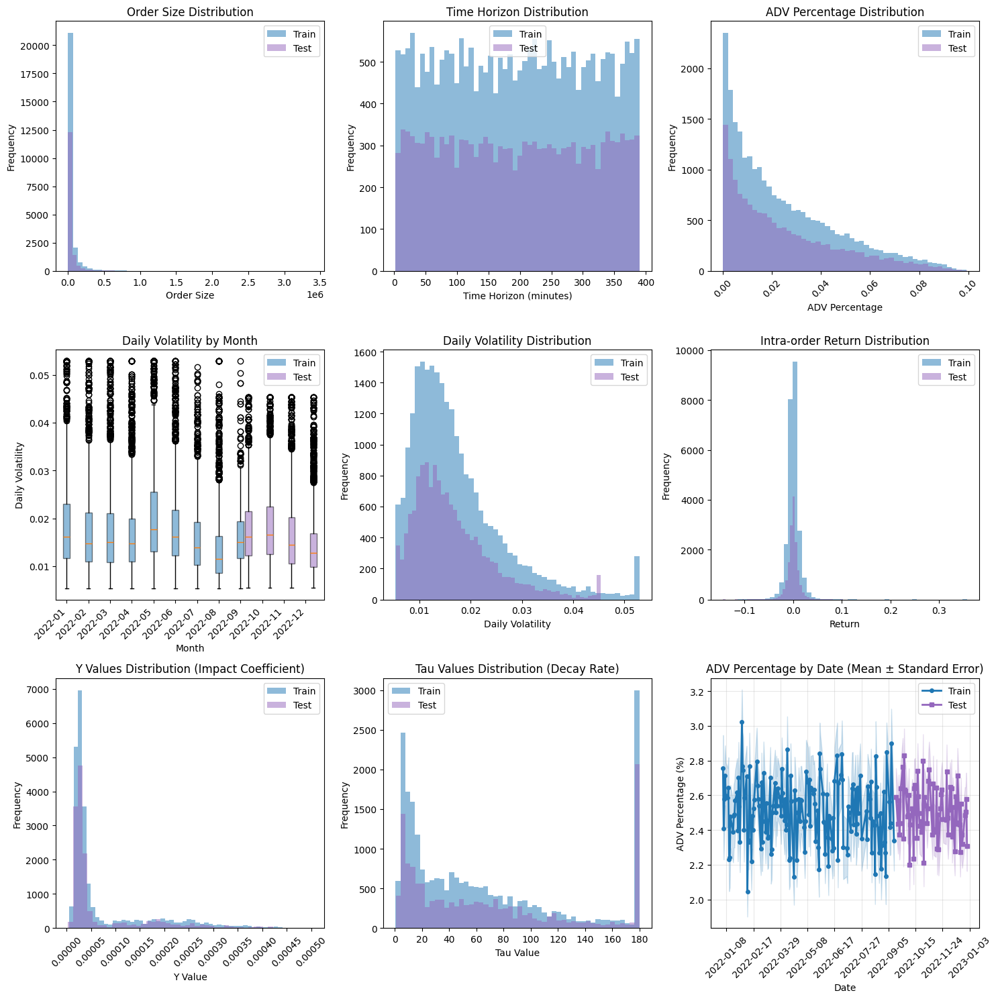


Sample train orders with dates:
  ticker        date  start_time  end_time  order_qty  side
0    NSC  2022-01-03          88       320       5003   buy
1    AEE  2022-02-23          19        34       1289  sell
2     CL  2022-02-17          44       238      77779   buy
3    WEC  2022-03-17          83       239      16812   buy
4  GOOGL  2022-06-02         269       371       5557   buy

Sample test orders with dates:
  ticker        date  start_time  end_time  order_qty  side
0      O  2022-09-30           9       386       6112  sell
1   ANET  2022-11-18           1       348      65340  sell
2    HAL  2022-12-16         183       334      67827  sell
3   GOOG  2022-09-22           9       386     318612   buy
4   INVH  2022-12-07         306       380       8465  sell


In [5]:
import importlib
import render_plots as rp

importlib.reload(rp)

# print orders dataframe in single line per order
rp.display_order_info(train_orders_df, name='Sample Train', num_orders=3)
rp.display_order_info(test_orders_df, name='Sample Test', num_orders=3)
rp.plot_order_histograms(train_orders_df, test_orders_df)

# Show sample orders with dates
print("\nSample train orders with dates:")
print(train_orders_df[['ticker', 'date', 'start_time', 'end_time', 'order_qty', 'side']].head(5))
print("\nSample test orders with dates:")
print(test_orders_df[['ticker', 'date', 'start_time', 'end_time', 'order_qty', 'side']].head(5))


                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        **RL Environment**

In the current setup the agent’s **state** at each step is a 14-dimensional real vector  
$$
s_t = \bigl[p_t^{\rm mid},\,V_t,\,T - t,\,q_t,\,\alpha,\,x,\,f,\,m,\,\delta,\,A,\,p_0,\,r,\,v^{(1)},\,v^{(5)}\bigr],
$$  
where it sees the current mid-price, market volume, time and shares remaining, target participation rate, trading signals, last fill and trade stats, arrival price, regime and short/long‐term volatilities.  Its **action**  
$$
a_t \in \{-1.0,\,-0.75,\, -0.5,\,-0.25,\,-0.1,\,0,\,0.10,\,0.15,\,0.25,\,0.50,\,0.75,\ 1.0\}
$$  
is “accelerate or decelerate versus the constant rate to trade this fraction of today’s volume,” so the env executes  
$$
\Delta q_t = \min(\rho_i(1 + a_t)\,V_t,\;q_t)
$$  
shares (and updates  
$$
q_{t+1} = q_t - \Delta q_t
$$  

$$\rho_i = \frac{Q_i}{V[t_{start}, t_{end}]}$$ 
and the running VWAP).  Episodes end when either all shares are filled or the time horizon is hit, a large penalty is applied if the order does not complete.


**Trading Simulation**

In order to realistically simulate market behaviour, each trade needs to create an impact on price, and successive trades must propagate impact to the next order and so on. Rather than consider the nuance of trade by trade, limit and market orders and order books which require many assumptions and complex limit order book simulators, we focus on minutely percentage of volume trading. This allows to focus on building an optimal scheduling algorithm and removes the granular complexities of limit order books, order types and venue types.

For minutely impact level impact estimations have utilized the transient impact model 2 from Bouchaud's book Trades, Quotes and Prices [7] which is parameterized with intuitive default values for this update and assumes the 1 minute trade impact follows square root.  We account for gaps between 1 minute trade intervals allowing for more accurate decay. In the final report, we will include a calibrated version of this model based on the trades observed via Bank of America's trade data. 


**Linear Transient‐Impact (Propagator) Model [7]**  
$$
r_t \;=\;\sum_{t'<t} G(t - t')\,\epsilon_{t'} \;+\;\eta_t,
$$
where $r_t = P_t - P_{t-1}$ is the mid-price return, $\epsilon_{t'}\!=\pm1$ the sign of the trade at time $t'$, $G(\tau)$ the propagator kernel, and $\eta_t$ an uncorrelated noise term.  

In our case we do allow for non-uniformity of time steps between trades so we modify to consider the $t_{\Delta}$:

$$
\lambda(\Delta t)
\;=\;
\exp\!\Bigl(-\frac{\Delta t}{\tau}\Bigr),
\quad
\Delta I_t
\;=\;
Y\,\sigma\,\sqrt{\frac{q_t}{V}},
$$

$$
I_t
\;=\;
\lambda(\Delta t)\,I_{t-1}
\;+\;
\Delta I_t,
$$

$$
p_t^{\mathrm{fill}}
\;=\;
p_t^{\mathrm{vwap}}
\bigl(1 \;+\; s\,I_t\bigr).
$$

In [12]:
# Create vectorized execution environments for training
print("Creating vectorized training environment...")
import importlib
import optimal_execution_env_vectorized as oeev
import cost_models
importlib.reload(oeev)
importlib.reload(cost_models)
from cost_models import StandardExecutionCostModel

rl_cost_model = StandardExecutionCostModel(risk_lambda=0.1)
PPO_GAMMA = 0.999  

print("Creating CPU training environment...")

# Use the new vectorized environment with wrapper for training
train_execution_cpu_env = oeev.VectorizedMultiOrderExecutionEnv(
    stock_df_list=train_stock_df_list,
    orders_df=train_orders_df,
    impact_coef=1,
    decay_rate=5,
    num_envs=num_vec_envs_cpu_train,  
    min_rate=0,
    max_rate=max_trading_rate,
    device='cpu',
    seed=fixed_seed,
    cost_model=rl_cost_model
)

train_execution_cpu_env = VecNormalize(
    train_execution_cpu_env,
    norm_obs=True, norm_reward=True,
    clip_obs=10., clip_reward=10.,
    gamma=PPO_GAMMA,   
)

# Check environment
print("OK: Vectorized cpu train environment loaded!")

# Create vectorized execution environments for testing (direct access for execution)
print("\nCreating vectorized cpu test environment...")


# for compatibility with training environment, create a GPU (if available) and CPU environment
if device in ["cuda", "mps"]:

    print("Initializing VectorizedMultiOrderExecutionEnv with training wrapper for GPU for training")

    train_execution_gpu_env = oeev.VectorizedMultiOrderExecutionEnv(
        stock_df_list=train_stock_df_list,
        orders_df=train_orders_df,
        impact_coef=1,
        decay_rate=5,
        num_envs=num_vec_envs_gpu,  
        min_rate=0,
        max_rate=max_trading_rate,
        device=device,
        seed=fixed_seed
    )

    train_execution_gpu_env = VecNormalize(
        train_execution_gpu_env,
        norm_obs=True, norm_reward=True,
        clip_obs=10., clip_reward=10.,
        gamma=PPO_GAMMA,   
    )   

    print("OK: VectorizedMultiOrderExecutionEnv with training wrapper for GPU for training loaded!")

    # Create vectorized execution environments for testing (direct access for execution)
    print("\nCreating vectorized gpu test environment...")
 
    test_execution_gpu_env = oeev.VectorizedMultiOrderExecutionEnv(
        stock_df_list=test_stock_df_list,
        orders_df=test_orders_df,
        impact_coef=1,
        decay_rate=5,
        num_envs=num_vec_envs_gpu,  
        min_rate=0,
        max_rate=max_trading_rate,
        device=device,
        seed=fixed_seed
    )
    
    print("OK: Vectorized gpu test environment check loaded!")

else:
    print("No GPU available, using CPU for training and testing")
    train_execution_gpu_env = train_execution_cpu_env
    test_execution_gpu_env = test_execution_cpu_env


print(f"\nVectorized Environment Summary:")
print(f"  - Training orders: {len(train_orders_df)}")
print(f"  - Test orders: {len(test_orders_df)}")
print(f"  - Vectorized environments: GPU: {num_vec_envs_gpu} and CPU train: {num_vec_envs_cpu_train} and CPU test: {num_vec_envs_cpu_test}")
if device in ["cuda", "mps"]:
    print(f"  - Device: {device} + CPU")
else:
    print(f"  - Device: cpu")


Creating vectorized training environment...
Creating CPU training environment...
2025-08-30 19:42:00 - optimal_execution_env_vectorized - INFO - Using device: cpu (explicitly set)
OK: Vectorized cpu train environment loaded!

Creating vectorized cpu test environment...
Initializing VectorizedMultiOrderExecutionEnv with training wrapper for GPU for training
2025-08-30 19:42:04 - optimal_execution_env_vectorized - INFO - Using device: cuda (explicitly set)
OK: VectorizedMultiOrderExecutionEnv with training wrapper for GPU for training loaded!

Creating vectorized gpu test environment...
2025-08-30 19:42:07 - optimal_execution_env_vectorized - INFO - Using device: cuda (explicitly set)
OK: Vectorized gpu test environment check loaded!

Vectorized Environment Summary:
  - Training orders: 25000
  - Test orders: 15000
  - Vectorized environments: GPU: 64 and CPU train: 64 and CPU test: 512
  - Device: cuda + CPU


In [13]:

# Set up environment for RL training 

importlib.reload(mp)
import ppo_optimizer as po
importlib.reload(po)
from ppo_optimizer import *


# Set up vectorized model parking and train a simple model
mp_vec = mp.ModelParking()

callbacks = create_training_callbacks(
    enable_custom=True,      # Enable custom TensorBoard logging
    enable_env_stats=True,   # Enable environment-specific stats
    enable_debug=False,      # Disable debug logging (can be verbose)
    verbose=0
)

num_orders_per_episode = 15000
num_train_steps = 390/2 * num_orders_per_episode

# Memory cleanup before training
if device != 'cpu':
    torch.cuda.empty_cache() if device == 'cuda' else None
    gc.collect()
    print("GPU memory cleaned")

print(f"Model parking vacated with {len(mp_vec.list_models()):.0f} left")



2025-08-30 19:42:08 - root - INFO - ModelParking initialized without cached models.
GPU memory cleaned
Model parking vacated with 0 left


In [ ]:

mlp_kwargs = dict(
    features_extractor_class=ExecFeaturesOptimized,  
    features_extractor_kwargs=dict(features_dim=256), 
    net_arch=dict(pi=[256, 256, 128], vf=[256, 256, 128]),      # <-- back to your 2-layer head
    activation_fn=nn.Tanh,
    ortho_init=False,
    share_features_extractor=True,
    normalize_images=False,
)


model_name = "ppo_mlp_cpu"
start_time = time.time()
print(f"\nTraining model: {model_name}")

po.train_ppo_fast(
    train_execution_cpu_env,
    model_name,
    num_train_steps,
    mp_vec=mp_vec,
    callbacks=callbacks,                 # <-- included
    ppo_kwargs=mlp_kwargs,
    device="cpu",
    ppo_gamma=PPO_GAMMA,
)

print(f"Model training completed time: {time.time() - start_time:.2f} seconds")


Training model: ppo_mlp_cpu

OPTIMIZED PPO TRAINING: ppo_mlp_cpu
Using cpu device
2025-08-30 19:42:08 - root - INFO - 
Optimized Training Configuration for ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3:
2025-08-30 19:42:08 - root - INFO -   - Parallel environments: 64
2025-08-30 19:42:08 - root - INFO -   - Steps per rollout: 2048
2025-08-30 19:42:08 - root - INFO -   - Total samples per rollout: 131,072
2025-08-30 19:42:08 - root - INFO -   - Batch size: 8,192
2025-08-30 19:42:08 - root - INFO -   - Mini-batches per epoch: 16
2025-08-30 19:42:08 - root - INFO -   - Epochs per update: 3
2025-08-30 19:42:08 - root - INFO -   - Approximate updates per second: 20.8
optimizer lr at init: 0.0003

Training ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3 for 2,925,000.0 timesteps...
Using 16 CPU threads for training
Logging to ./tensorboard_logs/ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3/PPO_10
---------------------------------------------------------------------
| custom/            

(<stable_baselines3.ppo.ppo.PPO at 0x70ad49382f60>, 979.2256066799164)

In [15]:
import baseline_strategies as bs
importlib.reload(bs)
import baseline_strategies as bs

# Add baseline strategies
baseline_strategies = []
print("\nSetting up baseline strategies...")
vwap_name = "vwap_baseline"
vwap_model = bs.VWAPBaseline()
mp_vec.park_model(vwap_model, vwap_name, learn=False, save=False)
baseline_strategies.append(vwap_name)

random_name = "random_baseline"
random_model = bs.RandomBaseline(seed=fixed_seed)
mp_vec.park_model(random_model, random_name, learn=False, save=False)
baseline_strategies.append(random_name)

pov_name = "pov_baseline"
pov_model = bs.POVBaseline()
mp_vec.park_model(pov_model, pov_name, learn=False, save=False)
baseline_strategies.append(pov_name)

twap_name = "twap_baseline"
twap_model = bs.TWAPBaseline()
mp_vec.park_model(twap_model, twap_name, learn=False, save=False)
baseline_strategies.append(twap_name)

# Add Almgren Chriss later
#almgren_name = "almgren_chriss_baseline"
#almgren_model = bs.AlmgrenChrissBaseline()
#mp_vec.park_model(almgren_model, almgren_name, learn=False, save=False)
#baseline_strategies.append(almgren_name)


print(f"Baseline models saved")


Setting up baseline strategies...
2025-08-30 19:58:28 - baseline_strategies - INFO - Initialized AdaptiveVWAP_Baseline strategy
2025-08-30 19:58:28 - baseline_strategies - INFO - Initialized Random_Baseline strategy
2025-08-30 19:58:28 - baseline_strategies - INFO - Initialized POV_Baseline strategy
Baseline models saved


In [ ]:
from torch import nn
import torch.nn.functional as F

import ppo_optimizer as po
importlib.reload(po)
import ppo_optimizer as po


model_name = "ppo_cnn_cpu"

start_time = time.time()
print(f"\nTraining model: {model_name}")


cnn_kwargs = dict(
    features_extractor_class=ExecCNNExtractor,
    features_extractor_kwargs=dict(features_dim=256),
    net_arch=dict(pi=[256,256,128], vf=[256,256,128]),
    activation_fn=nn.Tanh,
    ortho_init=False, share_features_extractor=True, normalize_images=False,
)


po.train_ppo_fast(train_execution_cpu_env, model_name=model_name, num_train_steps=num_train_steps,
                    mp_vec=mp_vec, callbacks=callbacks, device="cpu", ppo_kwargs=cnn_kwargs, ppo_gamma=PPO_GAMMA)

print(f"Model training completed time: {time.time() - start_time:.2f} seconds")



OPTIMIZED PPO TRAINING: ppo_cnn_cpu
Using cpu device
2025-08-30 20:00:55 - root - INFO - 
Optimized Training Configuration for ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3:
2025-08-30 20:00:55 - root - INFO -   - Parallel environments: 64
2025-08-30 20:00:55 - root - INFO -   - Steps per rollout: 2048
2025-08-30 20:00:55 - root - INFO -   - Total samples per rollout: 131,072
2025-08-30 20:00:55 - root - INFO -   - Batch size: 8,192
2025-08-30 20:00:55 - root - INFO -   - Mini-batches per epoch: 16
2025-08-30 20:00:55 - root - INFO -   - Epochs per update: 3
2025-08-30 20:00:55 - root - INFO -   - Approximate updates per second: 20.8
optimizer lr at init: 0.0003

Training ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3 for 2,925,000.0 timesteps...
Using 16 CPU threads for training
2025-08-30 20:00:55 - optimal_execution_env_vectorized - WARNING - Found 2 NaN or non-positive Y values, replacing with median 3.051648890637301e-05
2025-08-30 20:00:55 - optimal_execution_env_vectorized -

(<stable_baselines3.ppo.ppo.PPO at 0x70ad000f2990>, 1096.2973227500916)

In [27]:
import map_elites_oe_model 
importlib.reload(map_elites_oe_model)
from map_elites_oe_model import map_elites_liquidity_volatility_seeded, LiquidityVolatilityArchive


# set up liquidity/volatility bins
B_LIQ, B_VOL = 20, 20
def _to_bin(x, B): 
    try: return min(B-1, max(0, int(float(x) * B)))
    except: return 0

cell2indices = {}
orders_view = train_orders_df[["liq_norm","vol_norm"]].fillna(0.0).to_numpy(dtype=float)
for idx, (liq, vol) in enumerate(orders_view):
    i = _to_bin(liq, B_LIQ); j = _to_bin(vol, B_VOL)
    cell2indices.setdefault((i,j), []).append(idx)
nonempty_cells = [ij for ij, L in cell2indices.items() if L]

# TODO: option to load from disk later

ppo_model_names = [n for n in mp_vec.list_models() if n.lower().startswith("ppo_")]
   
for model_name in ppo_model_names:
    ppo_model = mp_vec.get_model(model_name)
    ppo_model.policy.eval()
    print(f"MAP-Elites LV for seed: {model_name}")

    archive_liquidity_volatility = map_elites_liquidity_volatility_seeded(
        env=train_execution_cpu_env,
        ppo_seed=ppo_model,
        cell2indices=cell2indices,
        nonempty_cells=nonempty_cells,
        orders_df=train_orders_df,
        B_LIQ=B_LIQ, B_VOL=B_VOL,
        iters=60,
        children_per_iter=64,
        eval_k=4,
        sigma=0.01
    )

MAP-Elites LV for seed: ppo_multiorder_exec_vec_nsteps_2048_batchsize_8192_epochs_3


TypeError: cannot pickle '_hashlib.HMAC' object

In [19]:
from tqdm import tqdm

import cost_models as cm
importlib.reload(cm)
import cost_models as cm

test_execution_cpu_env = oeev.VectorizedMultiOrderExecutionEnv(
    stock_df_list=test_stock_df_list,
    orders_df=test_orders_df,
    impact_coef=1,
    decay_rate=5,
    num_envs=num_vec_envs_cpu_test,  
    min_rate=0,
    max_rate=max_trading_rate,
    device='cpu',
    seed=fixed_seed,
    cost_model=rl_cost_model
)

print("OK: Vectorized cpu test environment loaded!")

if device in ["cuda", "mps"]:

    print("OK: VectorizedMultiOrderExecutionEnv with training wrapper for GPU for training loaded!")

    # Create vectorized execution environments for testing (direct access for execution)
    print("\nCreating vectorized gpu test environment...")
 
    test_execution_gpu_env = oeev.VectorizedMultiOrderExecutionEnv(
        stock_df_list=test_stock_df_list,
        orders_df=test_orders_df,
        impact_coef=1,
        decay_rate=5,
        num_envs=num_vec_envs_gpu,  
        min_rate=0,
        max_rate=max_trading_rate,
        device=device,
        seed=fixed_seed
    )
    
    print("OK: Vectorized gpu test environment check loaded!")

else:
    print("No GPU available, using CPU for training and testing")
    train_execution_gpu_env = train_execution_cpu_env
    test_execution_gpu_env = test_execution_cpu_env

print("="*80)
print("All models will execute the same orders")
print("="*80)

model_name_list = mp_vec.list_models()
print(f"Available models: {model_name_list}")

num_episodes = 10000  
execution_times = {}
test_orders = {}

print(f"All {len(model_name_list)} models will execute the same {num_episodes} orders for fair comparison.")
print("="*80)

# Manual consistent comparison approach
common_order_indices = None
i = 0

base_cpu_env = test_execution_cpu_env.venv if isinstance(test_execution_cpu_env, VecNormalize) else test_execution_cpu_env
common_order_indices = base_cpu_env.generate_random_order_indices(num_episodes) 
print(f"Using order indices: {common_order_indices[:5]}...{common_order_indices[-5:]} (showing first/last 5)")

# support with tqdm 
for i, model_name in enumerate(tqdm(model_name_list, desc="Executing models", leave=False)):

    model = mp_vec.get_model(model_name)
    
    # if device attribute exists and is in ["cuda", "mps"] then use the gpu environment
    # otherwise use the cpu environment
    if model_name in baseline_strategies:
        eval_execution_env = test_execution_cpu_env
        model.device = "cpu"
    else:
        if hasattr(model, 'device') and model.device in ["cuda", "mps"]:
            print(f"Using GPU environment for {model_name}")
            eval_execution_env = mp_vec.load_vecnorm(model_name, test_execution_gpu_env)
        else:
            print(f"Using CPU environment for {model_name}")
            # filter out baseline strategies
            eval_execution_env = mp_vec.load_vecnorm(model_name, test_execution_cpu_env)
            model.device = "cpu"

    print(f"\n{'='*60}")
    print(f"Executing orders with model: {model_name} with device: {model.device} ({i+1}/{len(model_name_list)})")
    print(f"{'='*60}")
    
    start_time = time.time()
    
    env_for_exec = eval_execution_env.venv if isinstance(eval_execution_env, VecNormalize) else eval_execution_env
    
    if isinstance(eval_execution_env, VecNormalize):
        eval_execution_env.training = False
        eval_execution_env.norm_reward = False
    
    orders = env_for_exec.execute_orders_vectorized(
        model=model,
        order_indices=common_order_indices,
        collect_step_info=True, 
        show_progress=True,
        
        )
    
    test_orders[model_name] = orders
    
    exec_time = time.time() - start_time
    execution_times[model_name] = exec_time
    
    print(f"Execution completed in {exec_time:.2f} seconds")
    print(f"Average time per episode: {exec_time/num_episodes:.3f} seconds")
    
    # Memory cleanup between models
    if hasattr(model, 'device') and model.device in ["cuda", "mps"]:
        if test_execution_env.device == 'cuda':
            torch.cuda.empty_cache()
        gc.collect()


print(f"\nEXECUTION COMPLETED!")
if common_order_indices is not None:
    print(f"All {len(model_name_list)} models executed the same {len(common_order_indices)} orders for fair comparison!")
    print(f"Order indices used: {common_order_indices}")
else:
    print("Using fallback method - orders may not be identical across models.")
    print("Consider checking the implementation of execute_orders method.")

print(f"\n{'='*60}")
print("VECTORIZED EXECUTION SUMMARY")
print(f"{'='*60}")
total_time = sum(execution_times.values())
for model_name, exec_time in execution_times.items():
    print(f"{model_name:30}: {exec_time:6.2f}s ({exec_time/num_episodes:.3f}s/episode)")
print(f"{'Total execution time':30}: {total_time:6.2f}s")
print(f"{'Average per model':30}: {total_time/len(execution_times):6.2f}s")


2025-08-30 20:20:06 - optimal_execution_env_vectorized - INFO - Using device: cpu (explicitly set)
OK: Vectorized cpu test environment loaded!
OK: VectorizedMultiOrderExecutionEnv with training wrapper for GPU for training loaded!

Creating vectorized gpu test environment...
2025-08-30 20:20:07 - optimal_execution_env_vectorized - INFO - Using device: cuda (explicitly set)
OK: Vectorized gpu test environment check loaded!
All models will execute the same orders
Available models: ['ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3', 'vwap_baseline', 'random_baseline', 'pov_baseline', 'twap_baseline', 'ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3']
All 6 models will execute the same 10000 orders for fair comparison.
Using order indices: [11499, 6475, 13167, 862, 5970]...[6003, 7739, 11417, 11633, 8397] (showing first/last 5)


Executing models:   0%|          | 0/6 [00:00<?, ?it/s]

Using CPU environment for ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3

Executing orders with model: ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3 with device: cpu (1/6)


2025-08-30 20:20:09 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.1141665592091315e-05
2025-08-30 20:20:09 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive tau values, replacing with median 50.64704003586178


2025-08-30 20:21:25 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 20:22:40 - optimal_execution_env_vectorized - WARNING - Found 16 NaN or non-positive Y values, replacing with median 3.024735294694169e-05


2025-08-30 20:24:00 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.9326372873631192e-05


2025-08-30 20:25:37 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 3.038644921344874e-05


2025-08-30 20:27:14 - optimal_execution_env_vectorized - WARNING - Found 13 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 20:28:33 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 3.0129504880967165e-05


2025-08-30 20:29:58 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.117848876240467e-05


2025-08-30 20:31:24 - optimal_execution_env_vectorized - WARNING - Found 23 NaN or non-positive Y values, replacing with median 2.935628705394864e-05


2025-08-30 20:32:43 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 2.9894542339755745e-05


2025-08-30 20:35:20 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 3.051909165229598e-05


2025-08-30 20:36:40 - optimal_execution_env_vectorized - WARNING - Found 21 NaN or non-positive Y values, replacing with median 2.9268549567074945e-05


2025-08-30 20:38:03 - optimal_execution_env_vectorized - WARNING - Found 14 NaN or non-positive Y values, replacing with median 3.0242865326231323e-05


2025-08-30 20:39:27 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.883961070426477e-05


2025-08-30 20:41:55 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 2.9131386010338805e-05


2025-08-30 20:43:29 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 3.0490522389882746e-05


2025-08-30 20:44:56 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 3.0554525629476745e-05


2025-08-30 20:46:24 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 2.9982285967007038e-05


2025-08-30 20:47:57 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 2.898949695570878e-05


2025-08-30 20:49:27 - optimal_execution_env_vectorized - WARNING - Found 5 NaN or non-positive Y values, replacing with median 1.925161324974963e-05


Executing models:  17%|█▋        | 1/6 [30:38<2:33:13, 1838.68s/it]

Execution completed in 1838.68 seconds
Average time per episode: 0.184 seconds

Executing orders with model: vwap_baseline with device: cpu (2/6)


2025-08-30 20:50:47 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.1141665592091315e-05


2025-08-30 20:51:14 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 20:51:38 - optimal_execution_env_vectorized - WARNING - Found 16 NaN or non-positive Y values, replacing with median 3.024735294694169e-05


2025-08-30 20:52:02 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.9326372873631192e-05


2025-08-30 20:52:26 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 3.038644921344874e-05


2025-08-30 20:52:52 - optimal_execution_env_vectorized - WARNING - Found 13 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 20:53:15 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 3.0129504880967165e-05


2025-08-30 20:53:35 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.117848876240467e-05


2025-08-30 20:53:55 - optimal_execution_env_vectorized - WARNING - Found 23 NaN or non-positive Y values, replacing with median 2.935628705394864e-05


2025-08-30 20:54:19 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 2.9894542339755745e-05


2025-08-30 20:54:45 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 3.051909165229598e-05


2025-08-30 20:55:08 - optimal_execution_env_vectorized - WARNING - Found 21 NaN or non-positive Y values, replacing with median 2.9268549567074945e-05


2025-08-30 20:55:32 - optimal_execution_env_vectorized - WARNING - Found 14 NaN or non-positive Y values, replacing with median 3.0242865326231323e-05


2025-08-30 20:55:57 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.883961070426477e-05


2025-08-30 20:56:21 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 2.9131386010338805e-05


2025-08-30 20:56:46 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 3.0490522389882746e-05


2025-08-30 20:57:12 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 3.0554525629476745e-05


2025-08-30 20:57:36 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 2.9982285967007038e-05


2025-08-30 20:58:01 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 2.898949695570878e-05


2025-08-30 20:58:25 - optimal_execution_env_vectorized - WARNING - Found 5 NaN or non-positive Y values, replacing with median 1.925161324974963e-05


Executing models:  33%|███▎      | 2/6 [38:37<1:09:15, 1038.76s/it]

Execution completed in 478.82 seconds
Average time per episode: 0.048 seconds

Executing orders with model: random_baseline with device: cpu (3/6)


2025-08-30 20:58:46 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.1141665592091315e-05


2025-08-30 20:59:10 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 20:59:33 - optimal_execution_env_vectorized - WARNING - Found 16 NaN or non-positive Y values, replacing with median 3.024735294694169e-05


2025-08-30 20:59:57 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.9326372873631192e-05


2025-08-30 21:00:21 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 3.038644921344874e-05


2025-08-30 21:00:45 - optimal_execution_env_vectorized - WARNING - Found 13 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:01:11 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 3.0129504880967165e-05


2025-08-30 21:01:34 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.117848876240467e-05


2025-08-30 21:01:58 - optimal_execution_env_vectorized - WARNING - Found 23 NaN or non-positive Y values, replacing with median 2.935628705394864e-05


2025-08-30 21:02:21 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 2.9894542339755745e-05


2025-08-30 21:02:46 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 3.051909165229598e-05


2025-08-30 21:03:09 - optimal_execution_env_vectorized - WARNING - Found 21 NaN or non-positive Y values, replacing with median 2.9268549567074945e-05


2025-08-30 21:03:33 - optimal_execution_env_vectorized - WARNING - Found 14 NaN or non-positive Y values, replacing with median 3.0242865326231323e-05


2025-08-30 21:03:57 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.883961070426477e-05


2025-08-30 21:04:21 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 2.9131386010338805e-05


2025-08-30 21:04:45 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 3.0490522389882746e-05


2025-08-30 21:05:11 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 3.0554525629476745e-05


2025-08-30 21:05:34 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 2.9982285967007038e-05


2025-08-30 21:05:58 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 2.898949695570878e-05


2025-08-30 21:06:23 - optimal_execution_env_vectorized - WARNING - Found 5 NaN or non-positive Y values, replacing with median 1.925161324974963e-05


Executing models:  50%|█████     | 3/6 [46:34<39:07, 782.47s/it]   

Execution completed in 477.49 seconds
Average time per episode: 0.048 seconds

Executing orders with model: pov_baseline with device: cpu (4/6)


2025-08-30 21:06:44 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.1141665592091315e-05


2025-08-30 21:07:07 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:07:31 - optimal_execution_env_vectorized - WARNING - Found 16 NaN or non-positive Y values, replacing with median 3.024735294694169e-05


2025-08-30 21:07:54 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.9326372873631192e-05


2025-08-30 21:08:18 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 3.038644921344874e-05


2025-08-30 21:08:44 - optimal_execution_env_vectorized - WARNING - Found 13 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:09:08 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 3.0129504880967165e-05


2025-08-30 21:09:31 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.117848876240467e-05


2025-08-30 21:09:55 - optimal_execution_env_vectorized - WARNING - Found 23 NaN or non-positive Y values, replacing with median 2.935628705394864e-05


2025-08-30 21:10:18 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 2.9894542339755745e-05


2025-08-30 21:10:44 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 3.051909165229598e-05


2025-08-30 21:11:07 - optimal_execution_env_vectorized - WARNING - Found 21 NaN or non-positive Y values, replacing with median 2.9268549567074945e-05


2025-08-30 21:11:31 - optimal_execution_env_vectorized - WARNING - Found 14 NaN or non-positive Y values, replacing with median 3.0242865326231323e-05


2025-08-30 21:11:55 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.883961070426477e-05


2025-08-30 21:12:19 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 2.9131386010338805e-05


2025-08-30 21:12:44 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 3.0490522389882746e-05


2025-08-30 21:13:10 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 3.0554525629476745e-05


2025-08-30 21:13:33 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 2.9982285967007038e-05


2025-08-30 21:13:57 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 2.898949695570878e-05


2025-08-30 21:14:21 - optimal_execution_env_vectorized - WARNING - Found 5 NaN or non-positive Y values, replacing with median 1.925161324974963e-05


Executing models:  67%|██████▋   | 4/6 [54:33<22:05, 662.64s/it]

Execution completed in 478.94 seconds
Average time per episode: 0.048 seconds

Executing orders with model: twap_baseline with device: cpu (5/6)


2025-08-30 21:14:43 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.1141665592091315e-05


2025-08-30 21:15:07 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:15:32 - optimal_execution_env_vectorized - WARNING - Found 16 NaN or non-positive Y values, replacing with median 3.024735294694169e-05


2025-08-30 21:15:57 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.9326372873631192e-05


2025-08-30 21:16:21 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 3.038644921344874e-05


2025-08-30 21:16:46 - optimal_execution_env_vectorized - WARNING - Found 13 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:17:12 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 3.0129504880967165e-05


2025-08-30 21:17:36 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.117848876240467e-05


2025-08-30 21:18:00 - optimal_execution_env_vectorized - WARNING - Found 23 NaN or non-positive Y values, replacing with median 2.935628705394864e-05


2025-08-30 21:18:23 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 2.9894542339755745e-05


2025-08-30 21:18:47 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 3.051909165229598e-05


2025-08-30 21:19:11 - optimal_execution_env_vectorized - WARNING - Found 21 NaN or non-positive Y values, replacing with median 2.9268549567074945e-05


2025-08-30 21:19:37 - optimal_execution_env_vectorized - WARNING - Found 14 NaN or non-positive Y values, replacing with median 3.0242865326231323e-05


2025-08-30 21:20:02 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.883961070426477e-05


2025-08-30 21:20:26 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 2.9131386010338805e-05


2025-08-30 21:20:51 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 3.0490522389882746e-05


2025-08-30 21:21:15 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 3.0554525629476745e-05


2025-08-30 21:21:39 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 2.9982285967007038e-05


2025-08-30 21:22:07 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 2.898949695570878e-05


2025-08-30 21:22:31 - optimal_execution_env_vectorized - WARNING - Found 5 NaN or non-positive Y values, replacing with median 1.925161324974963e-05


Executing models:  83%|████████▎ | 5/6 [1:02:40<09:59, 599.30s/it]

Execution completed in 486.98 seconds
Average time per episode: 0.049 seconds
Using CPU environment for ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3

Executing orders with model: ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3 with device: cpu (6/6)


2025-08-30 21:22:50 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.1141665592091315e-05


2025-08-30 21:25:45 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:28:24 - optimal_execution_env_vectorized - WARNING - Found 16 NaN or non-positive Y values, replacing with median 3.024735294694169e-05


2025-08-30 21:31:09 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.9326372873631192e-05


2025-08-30 21:34:00 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 3.038644921344874e-05


2025-08-30 21:36:47 - optimal_execution_env_vectorized - WARNING - Found 13 NaN or non-positive Y values, replacing with median 2.957573293800573e-05


2025-08-30 21:39:35 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 3.0129504880967165e-05


2025-08-30 21:42:21 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 3.117848876240467e-05


2025-08-30 21:45:15 - optimal_execution_env_vectorized - WARNING - Found 23 NaN or non-positive Y values, replacing with median 2.935628705394864e-05


2025-08-30 21:47:57 - optimal_execution_env_vectorized - WARNING - Found 15 NaN or non-positive Y values, replacing with median 2.9894542339755745e-05


2025-08-30 21:50:40 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 3.051909165229598e-05


2025-08-30 21:53:27 - optimal_execution_env_vectorized - WARNING - Found 21 NaN or non-positive Y values, replacing with median 2.9268549567074945e-05


2025-08-30 21:56:14 - optimal_execution_env_vectorized - WARNING - Found 14 NaN or non-positive Y values, replacing with median 3.0242865326231323e-05


2025-08-30 21:58:58 - optimal_execution_env_vectorized - WARNING - Found 12 NaN or non-positive Y values, replacing with median 2.883961070426477e-05


2025-08-30 22:01:56 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 2.9131386010338805e-05


2025-08-30 22:04:47 - optimal_execution_env_vectorized - WARNING - Found 11 NaN or non-positive Y values, replacing with median 3.0490522389882746e-05


2025-08-30 22:07:29 - optimal_execution_env_vectorized - WARNING - Found 17 NaN or non-positive Y values, replacing with median 3.0554525629476745e-05


2025-08-30 22:10:13 - optimal_execution_env_vectorized - WARNING - Found 22 NaN or non-positive Y values, replacing with median 2.9982285967007038e-05


2025-08-30 22:13:09 - optimal_execution_env_vectorized - WARNING - Found 20 NaN or non-positive Y values, replacing with median 2.898949695570878e-05


2025-08-30 22:15:48 - optimal_execution_env_vectorized - WARNING - Found 5 NaN or non-positive Y values, replacing with median 1.925161324974963e-05


Execution completed in 3327.00 seconds
Average time per episode: 0.333 seconds

EXECUTION COMPLETED!
All 6 models executed the same 10000 orders for fair comparison!
Order indices used: [11499, 6475, 13167, 862, 5970, 6706, 3017, 3781, 3898, 2250, 542, 4351, 12807, 6631, 6705, 6978, 7399, 11119, 12665, 5304, 2312, 7040, 1889, 8991, 169, 1795, 3975, 6820, 7826, 11809, 1039, 2848, 3371, 8829, 10349, 8797, 764, 1593, 14232, 5872, 9940, 5169, 10909, 4122, 12948, 14482, 149, 11736, 387, 3946, 13402, 1373, 2884, 14042, 11360, 2991, 11595, 10581, 14867, 14424, 3024, 251, 12146, 11438, 7092, 932, 7217, 3684, 8368, 9478, 11724, 7417, 10504, 10515, 13509, 7172, 3328, 5023, 2214, 2216, 14795, 2859, 4024, 2760, 3290, 10043, 2626, 4609, 13283, 12472, 11739, 6661, 13939, 7359, 3204, 11752, 6126, 14629, 2678, 3708, 9987, 2805, 1453, 14421, 9999, 2319, 13882, 12608, 7333, 3651, 2288, 3623, 13618, 4878, 1713, 14505, 3589, 9466, 5155, 12594, 13673, 3669, 14324, 13524, 8384, 14210, 4387, 9123, 7894, 1489

In [20]:
import gc

gc.collect()

# store all tca for future recovery
import tca_data_manager as tca

tcadm = tca.TCADataManager()
tcadm.save_orders(test_orders)

Saved 10000 orders to: tca_data/tca_data_20250830_222928.parquet


PosixPath('tca_data/tca_data_20250830_222928.parquet')

Generating vectorized analysis...

Vectorized Test Environment Results:

Execution Summary Table
Slippage trimmed (top/bottom 1.0% by notional weight)
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Agent                      Count|Notional (M)|  Trim Count|Trim Not (M)|Slippage (bps)|Slippage SE (bps)|Duration Ratio| Duration SE|Return (bps)|Return SE (bps)|Cum Impact (bps)|Cum Impact SE (bps)|Reward (bps)|Reward SE (bps)|    Action %| Action SE %|Incomplete %|No Arrival %|
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
ppo_mlp_cpu_nsteps          9800     41947.3          66    

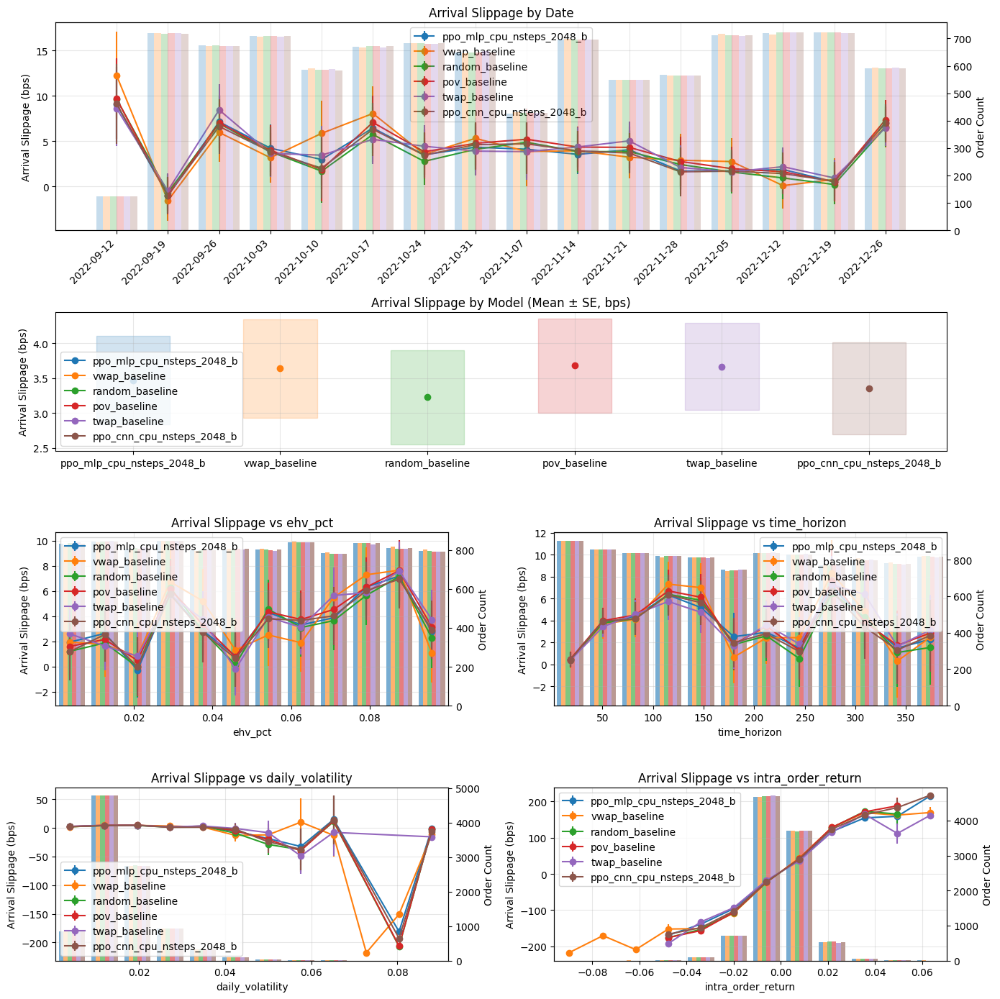

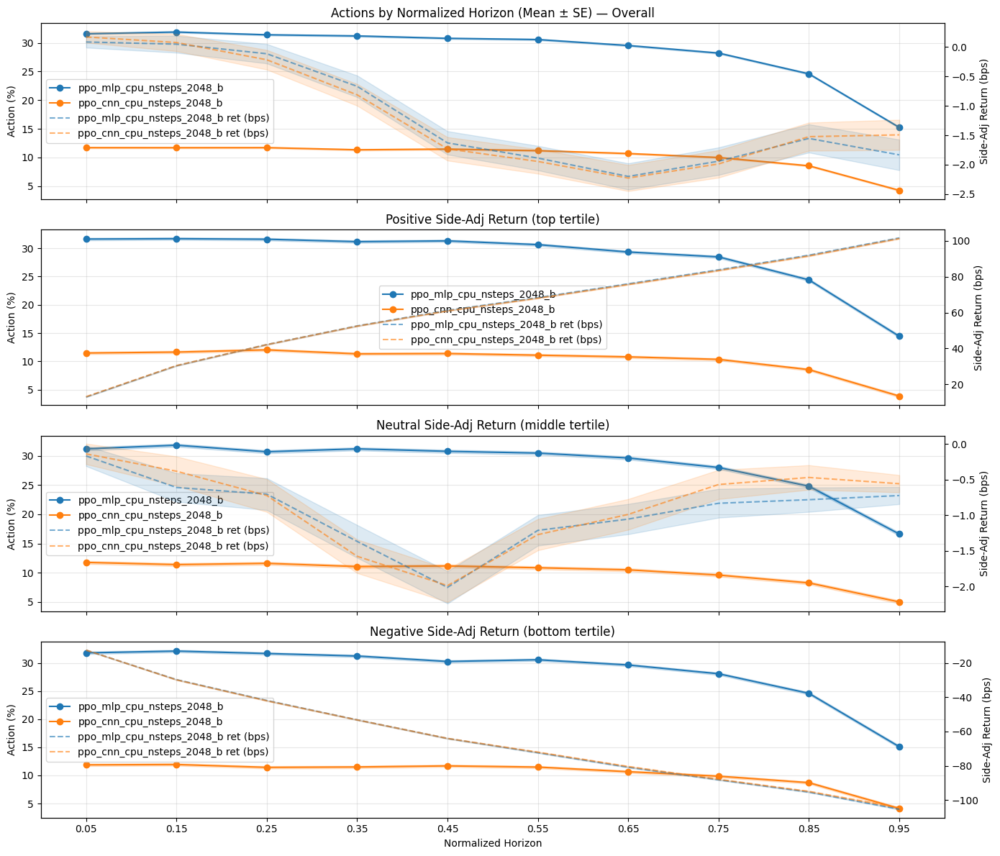


=== Plotting orders for ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3 ===


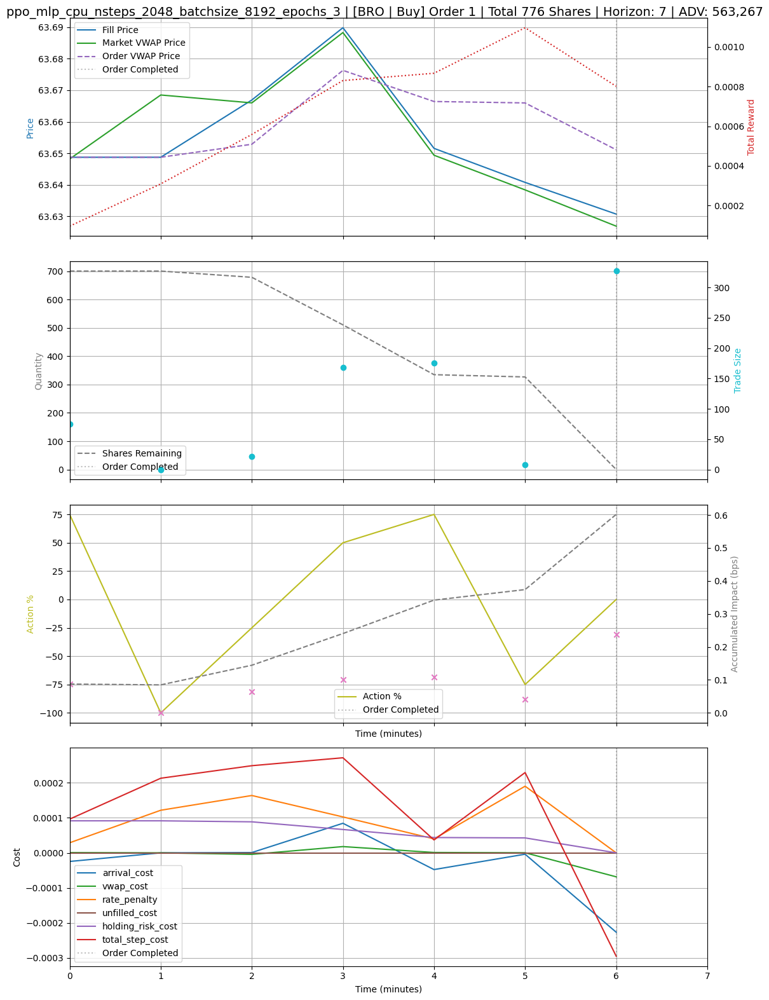

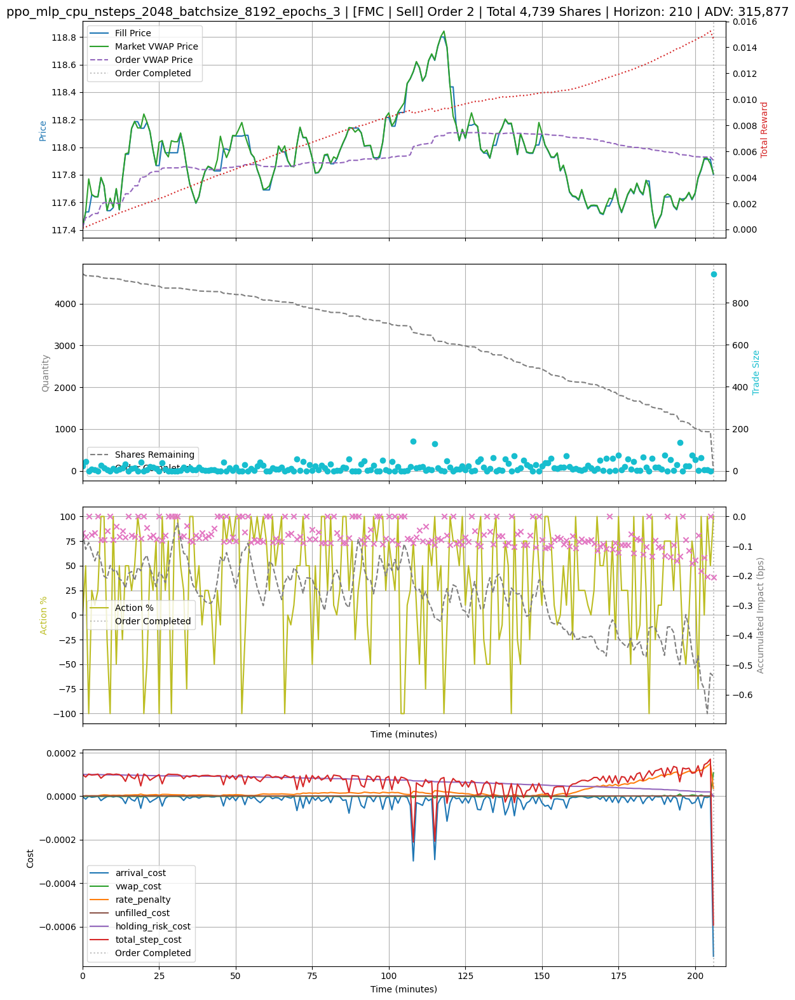

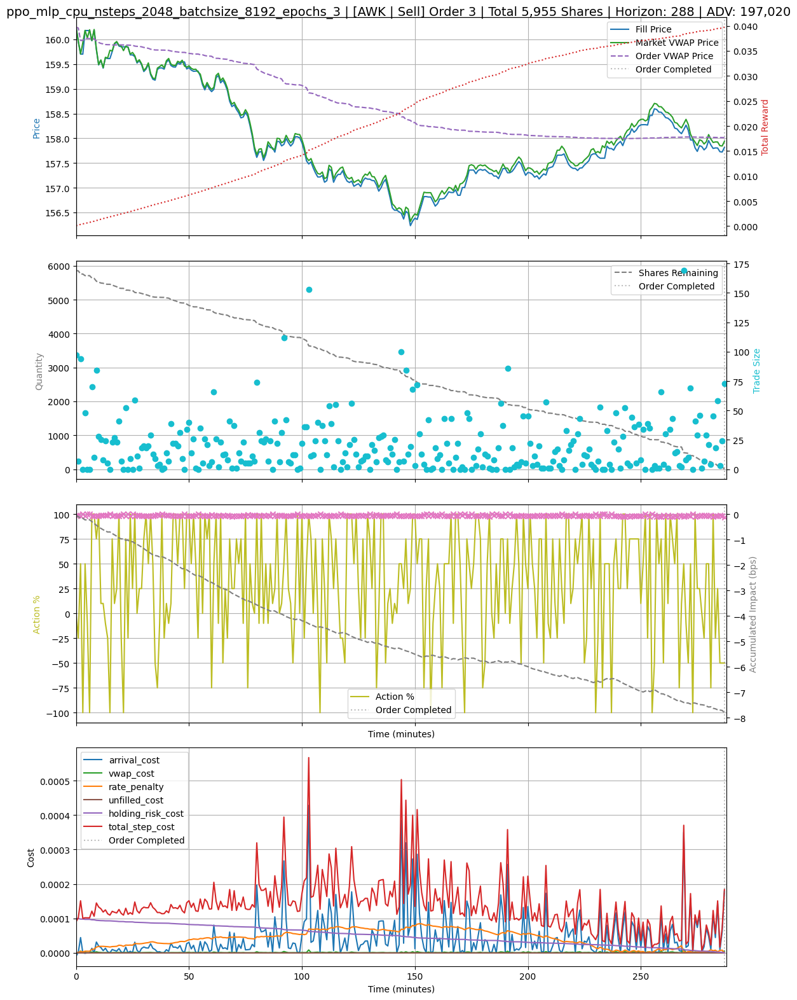


=== Plotting orders for vwap_baseline ===


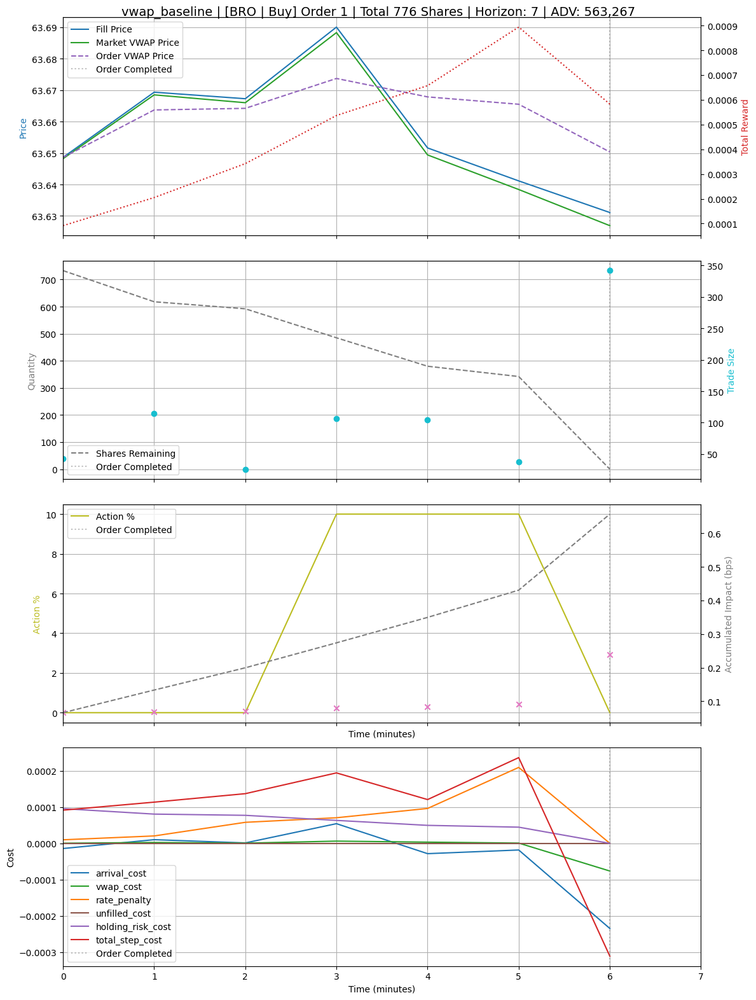

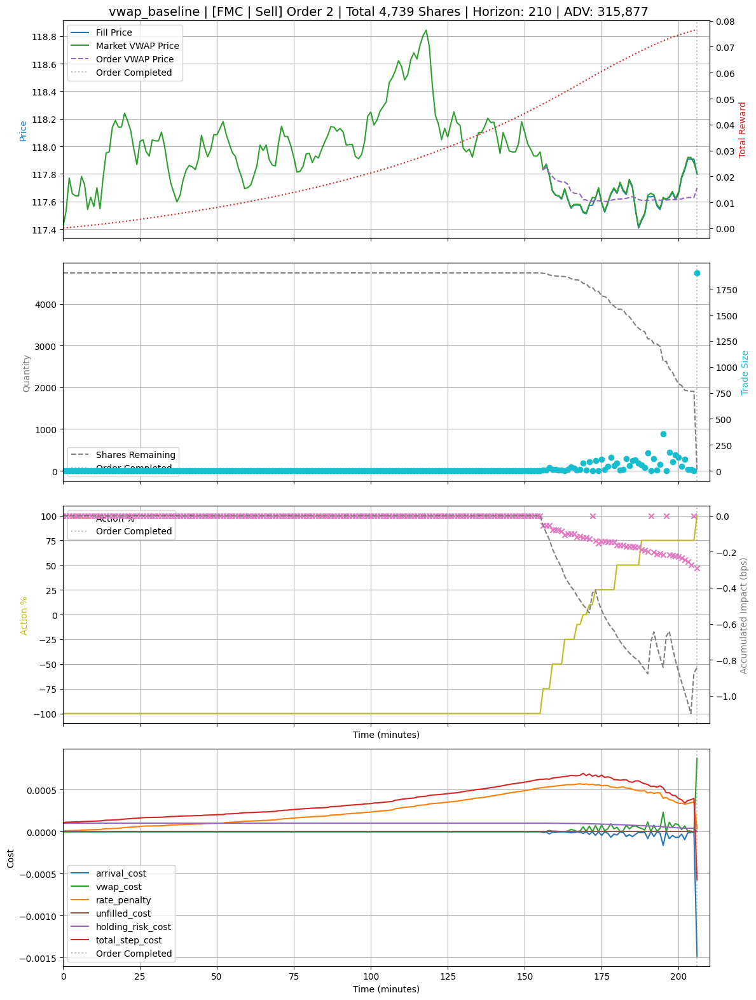

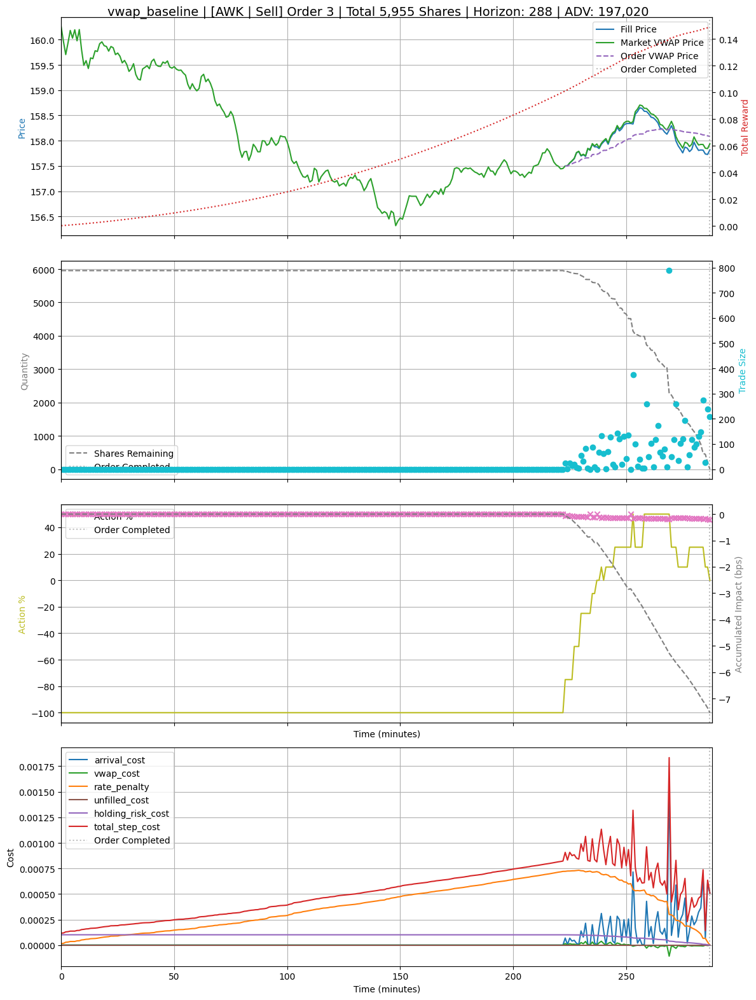


=== Plotting orders for random_baseline ===


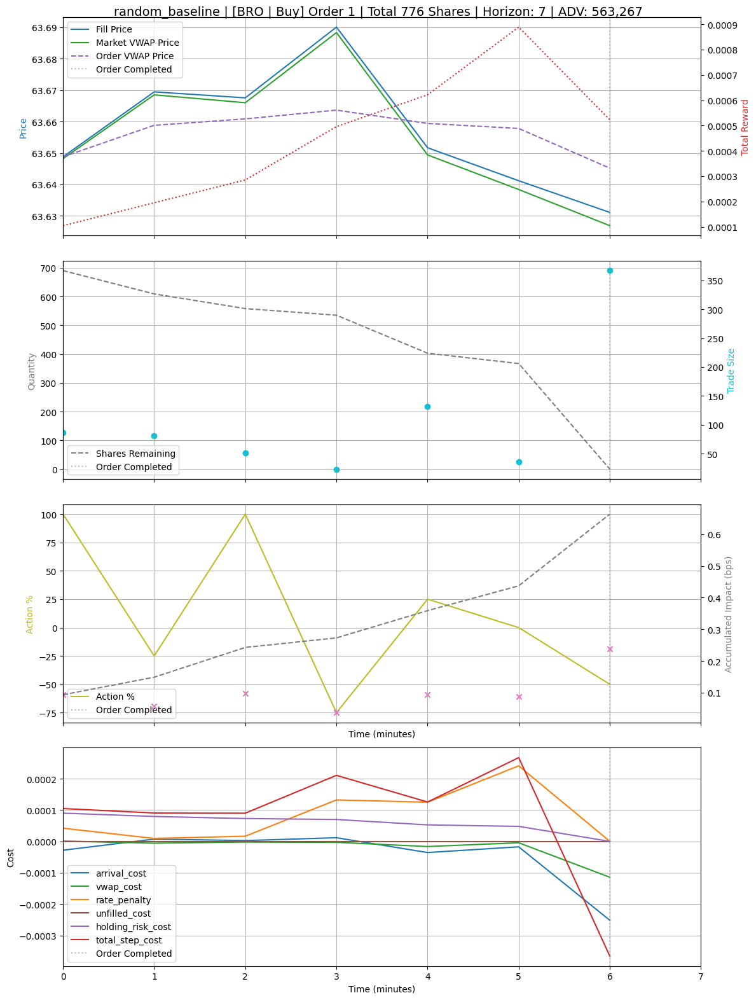

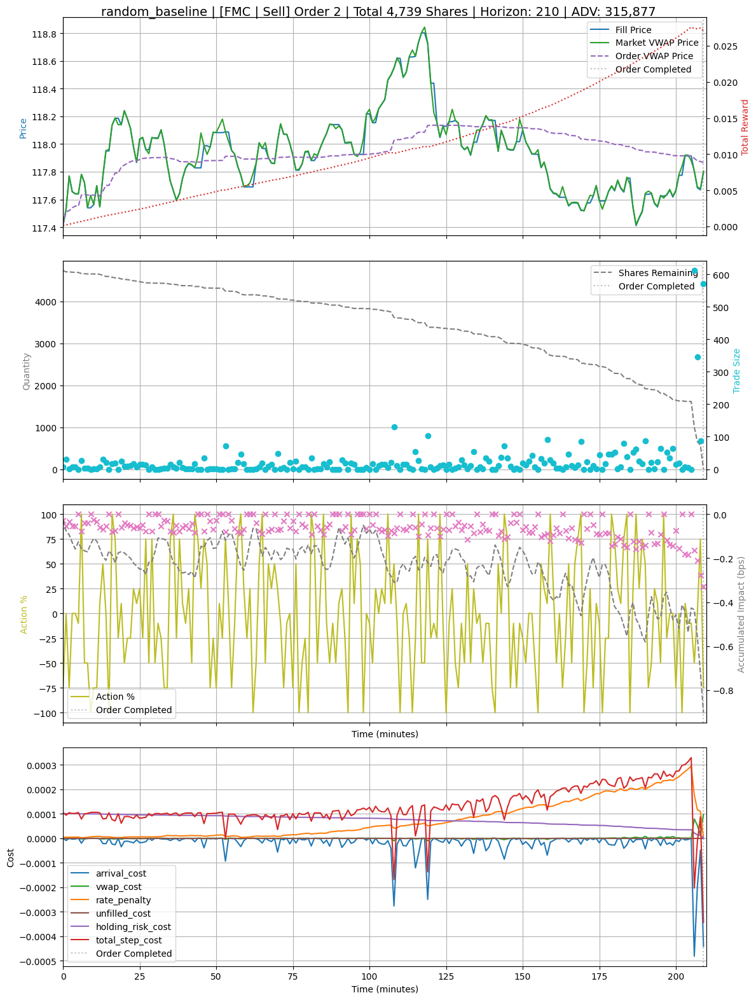

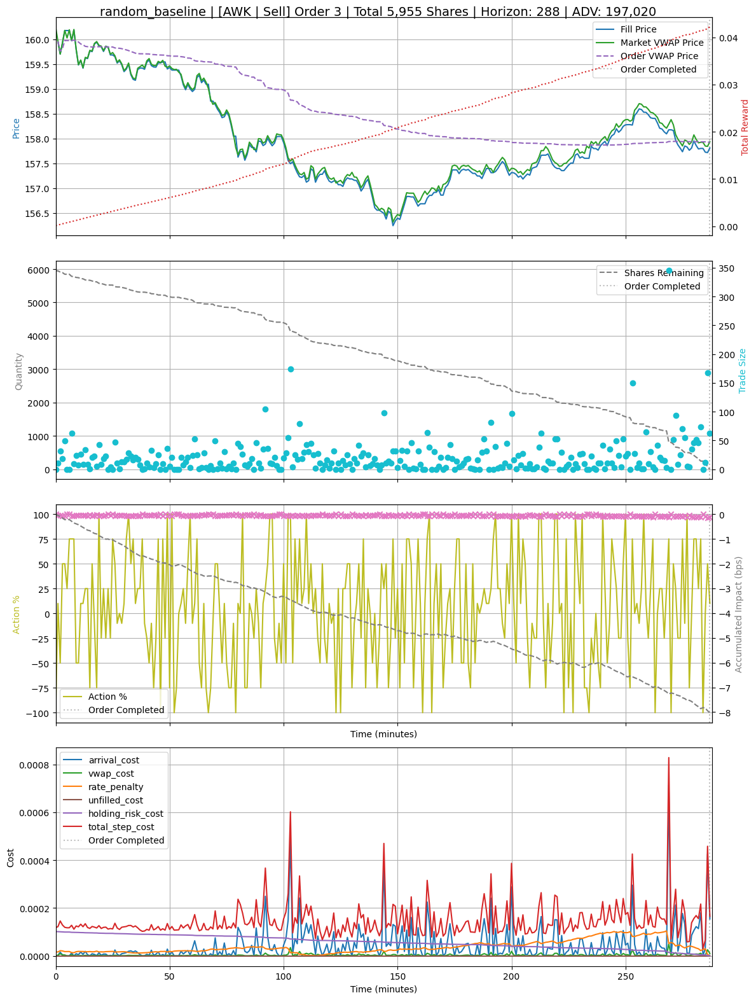


=== Plotting orders for pov_baseline ===


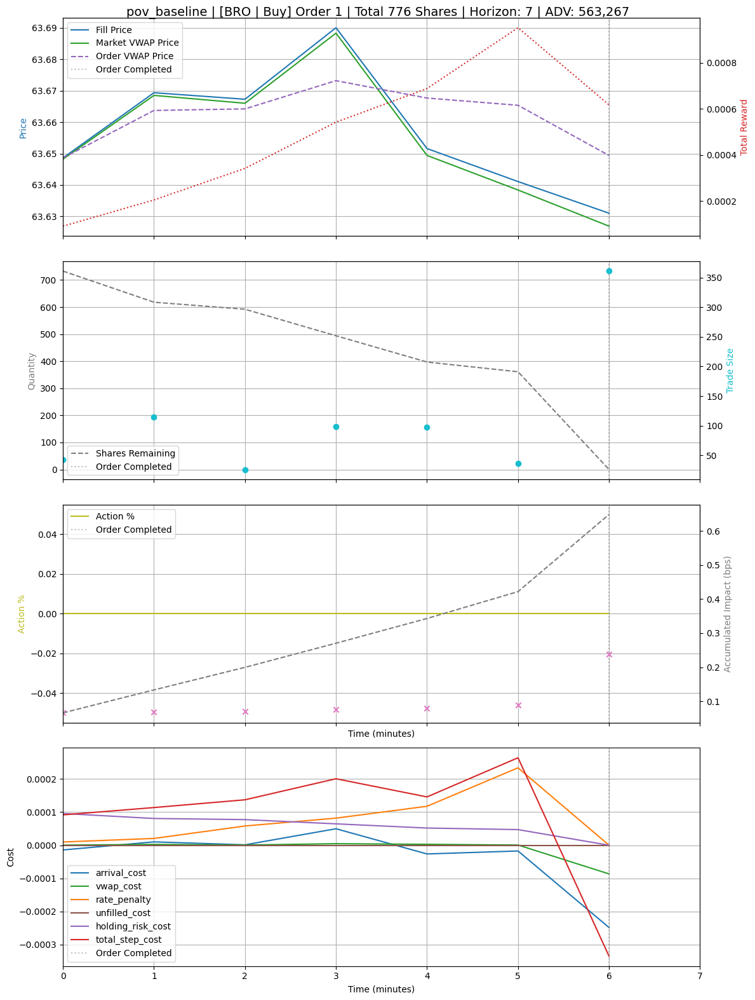

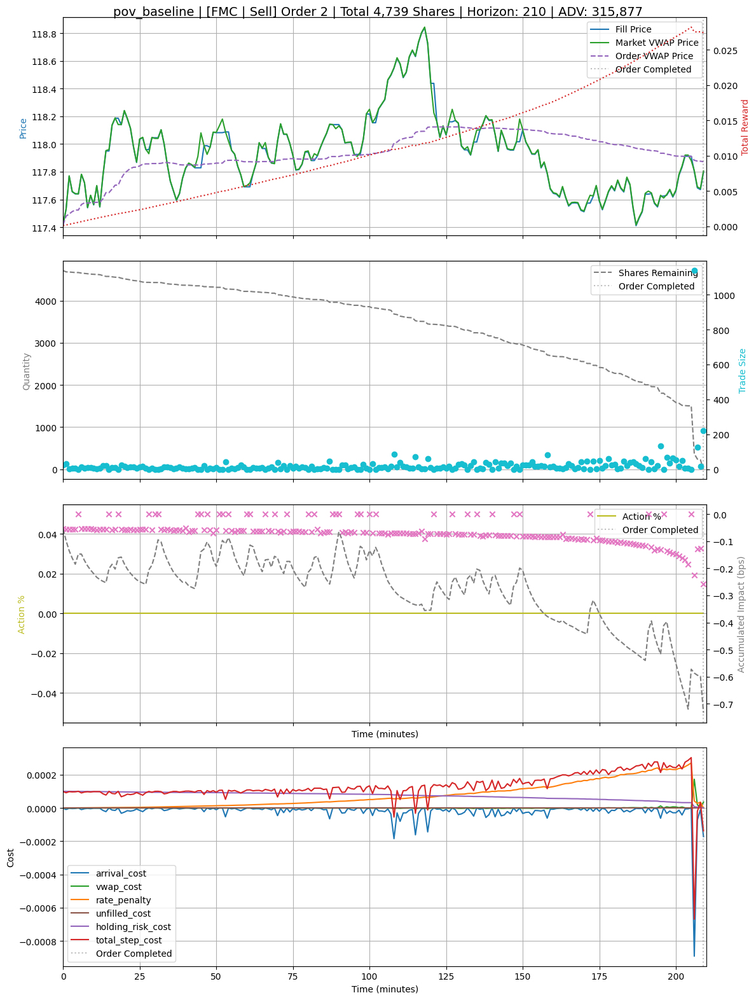

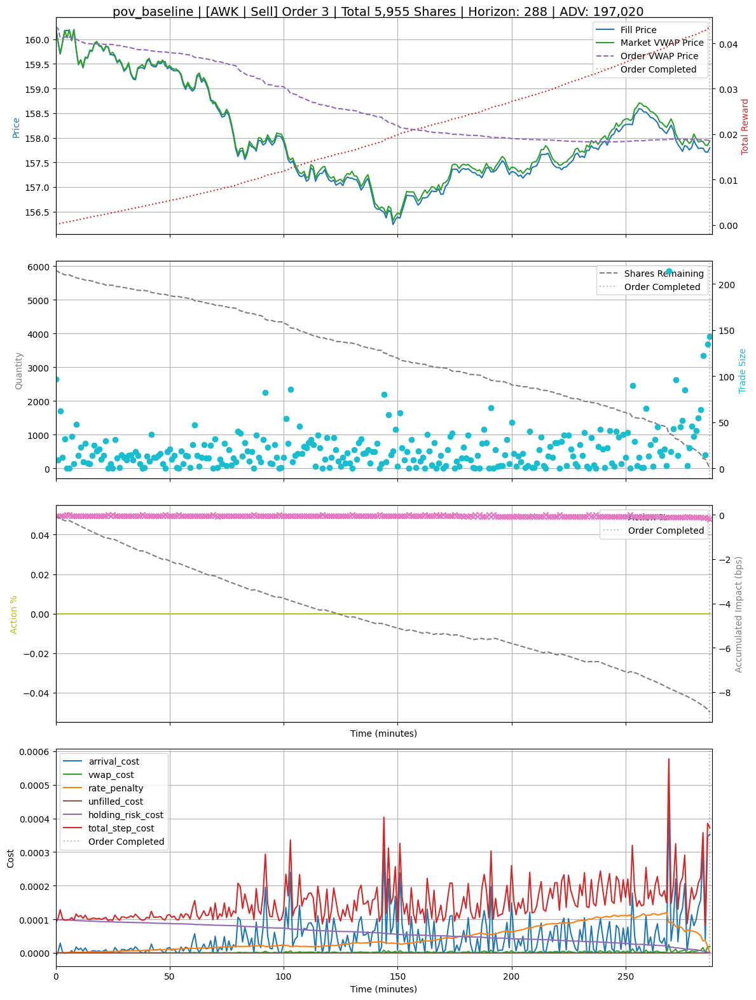


=== Plotting orders for twap_baseline ===


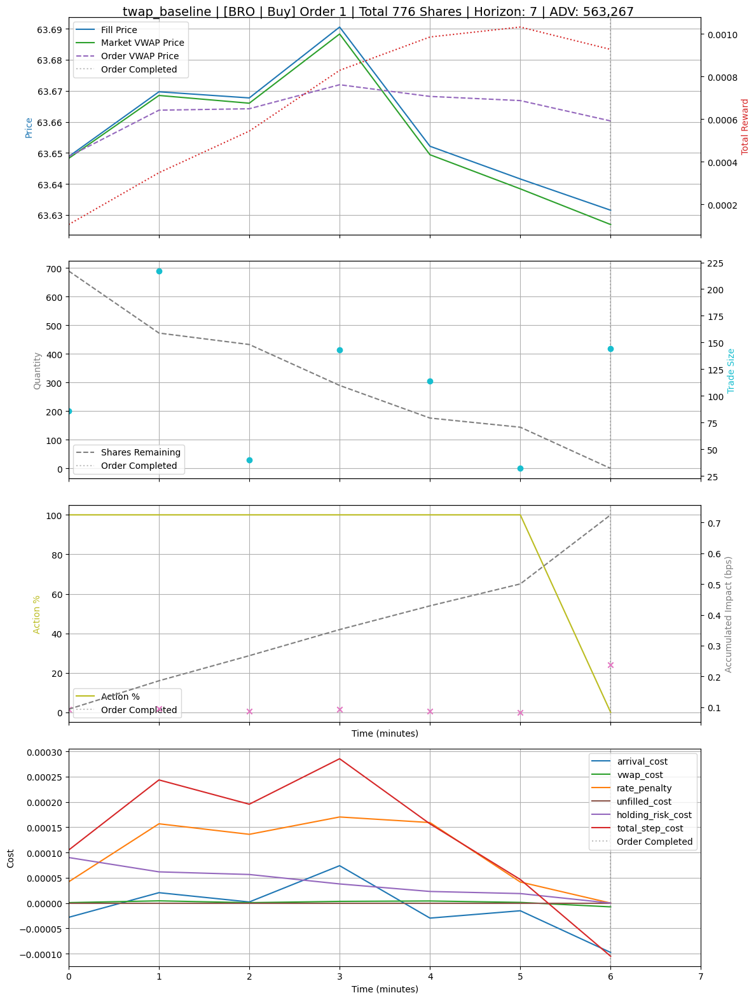

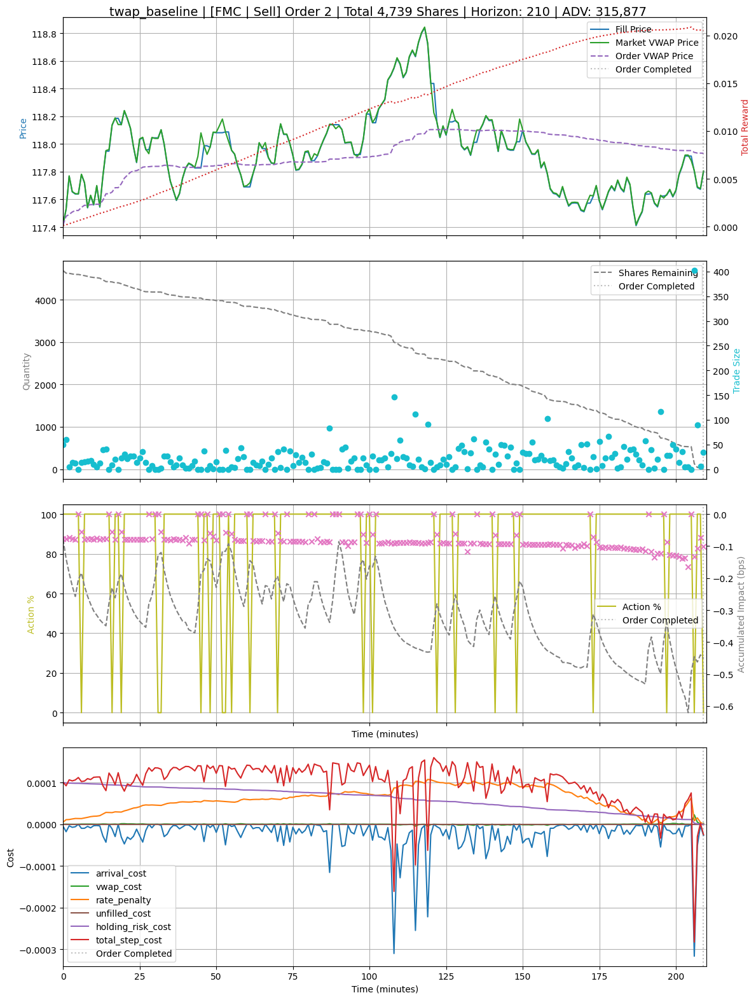

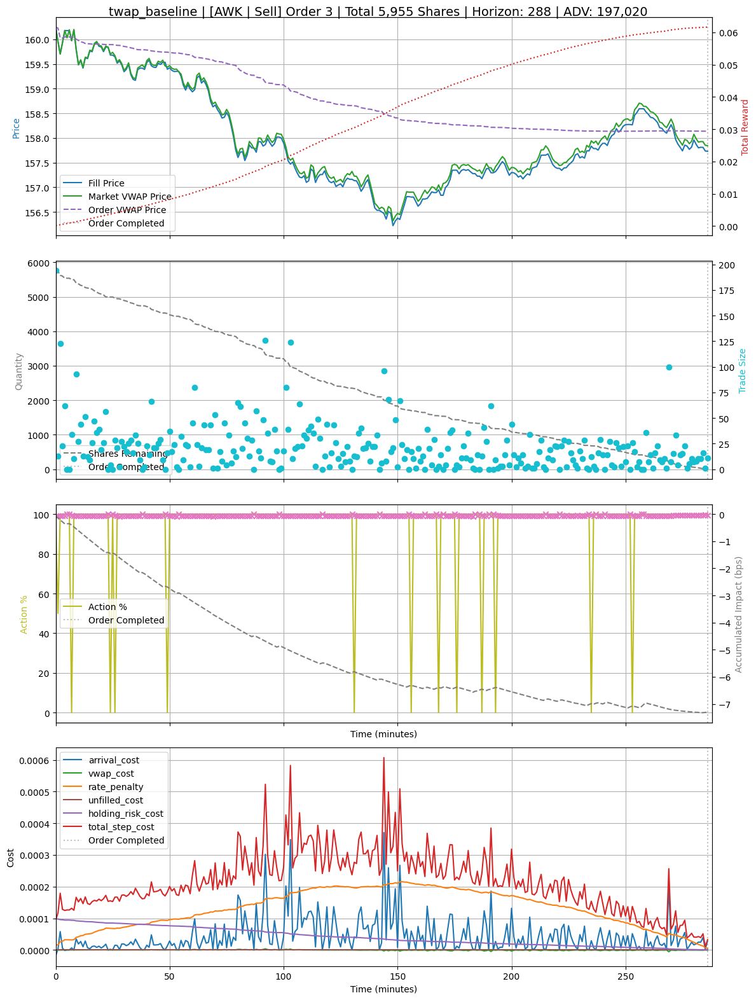


=== Plotting orders for ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3 ===


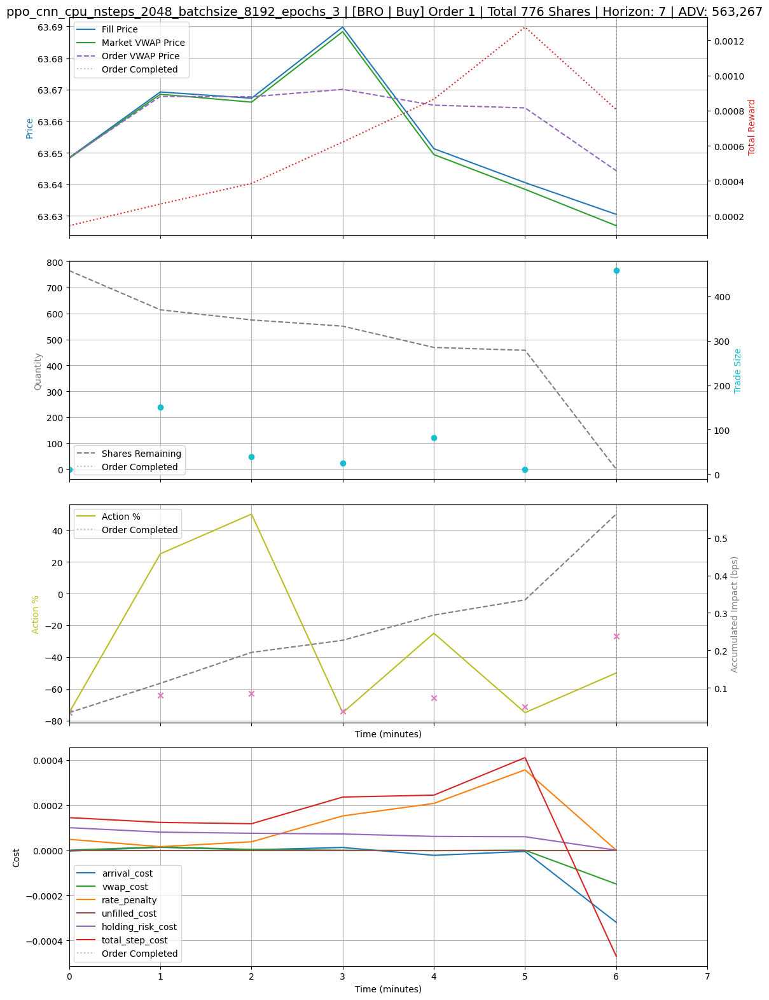

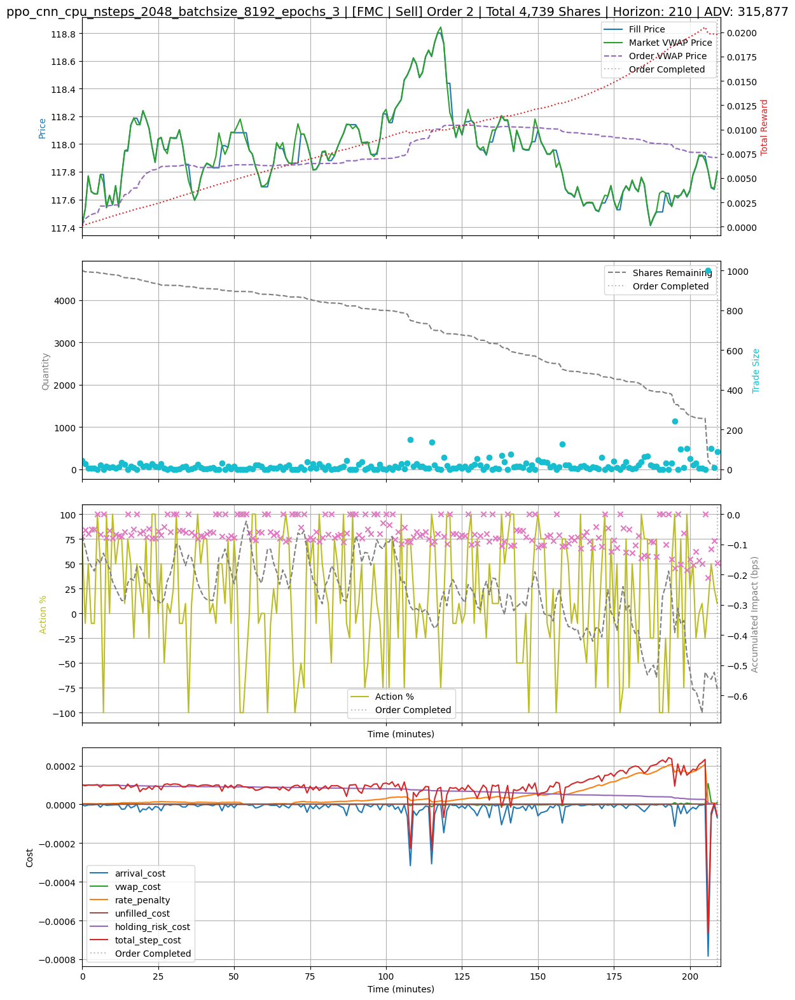

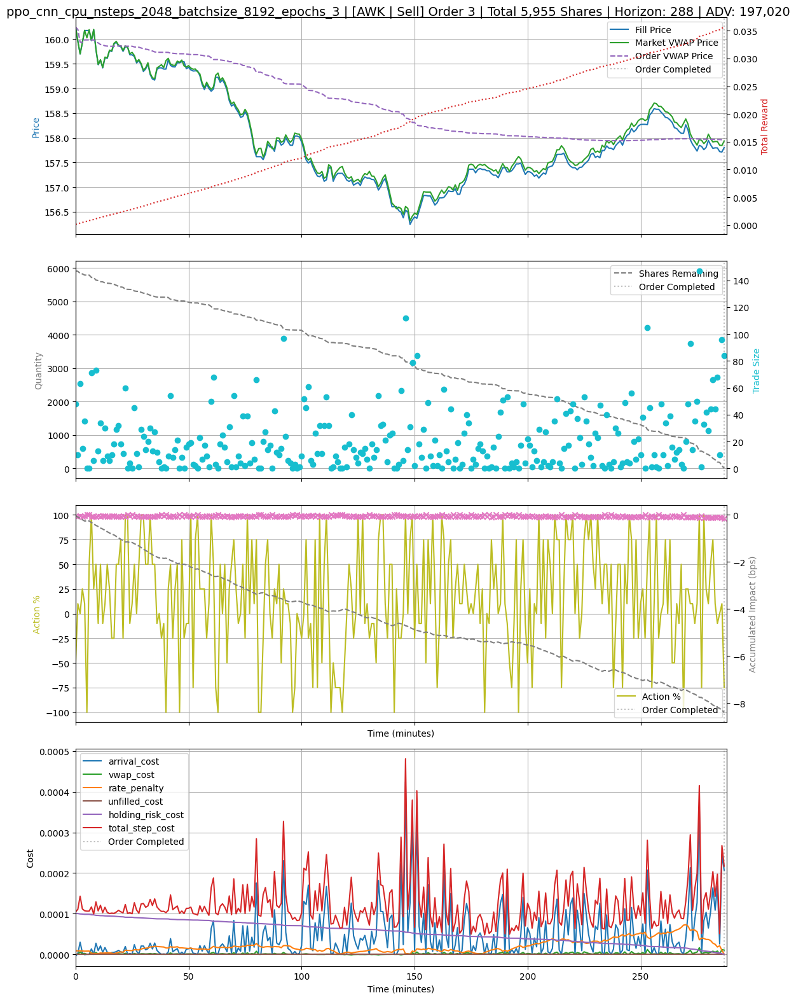


=== Plotting orders for ppo_mlp_cpu_nsteps_2048_batchsize_8192_epochs_3 ===


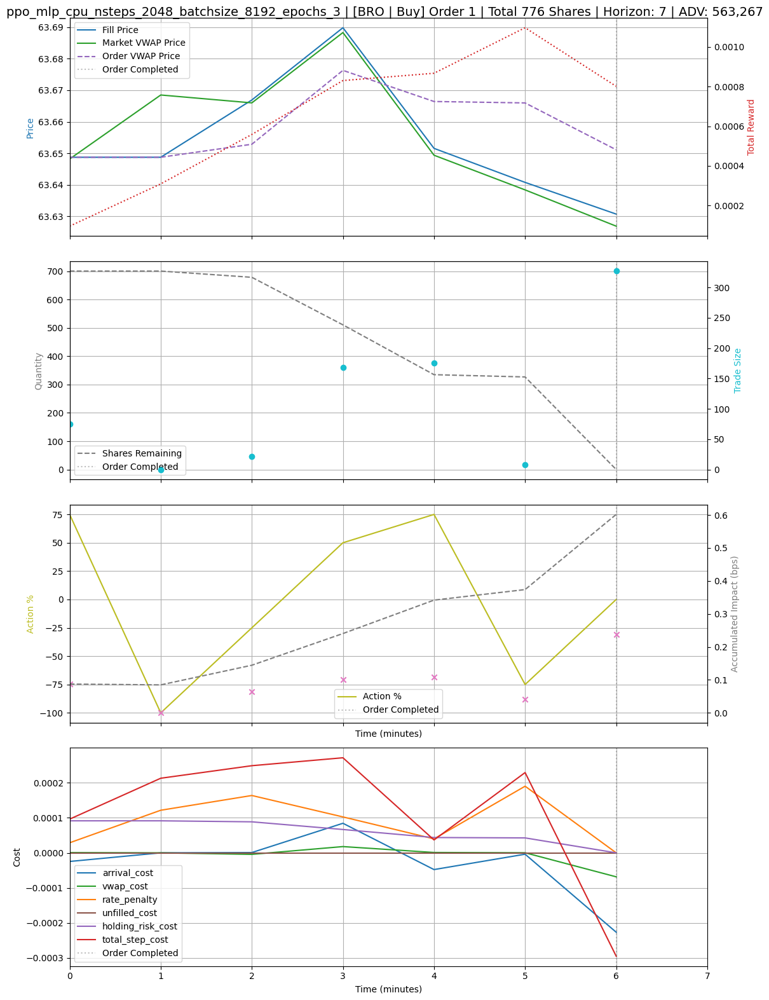

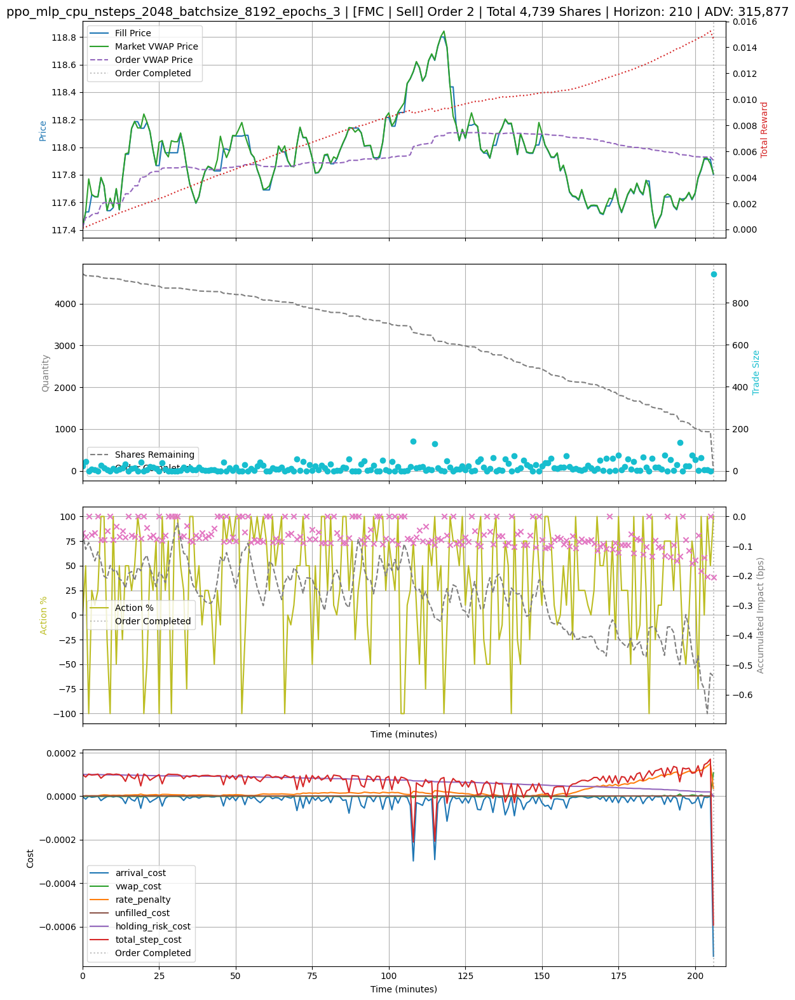

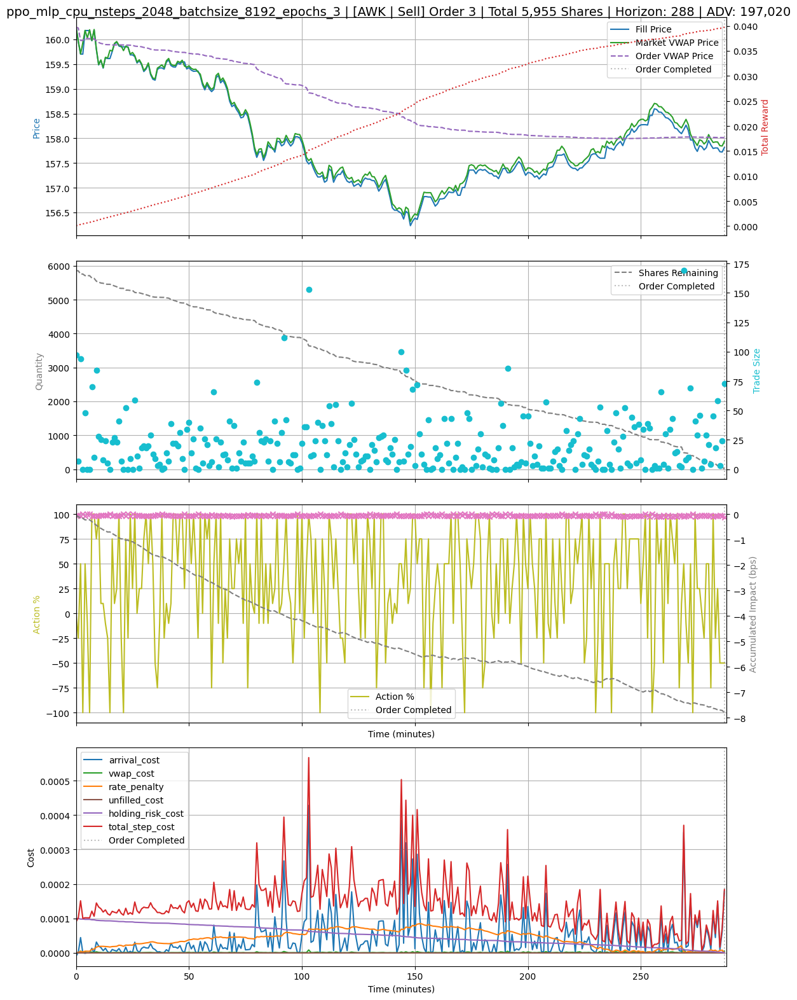


=== Plotting orders for vwap_baseline ===


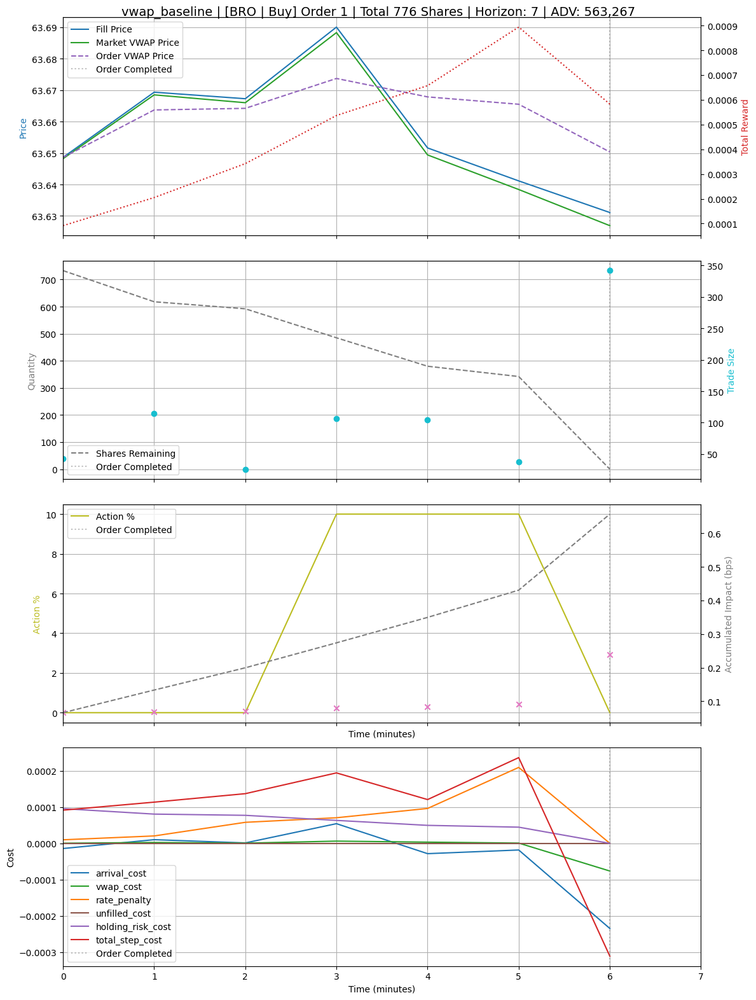

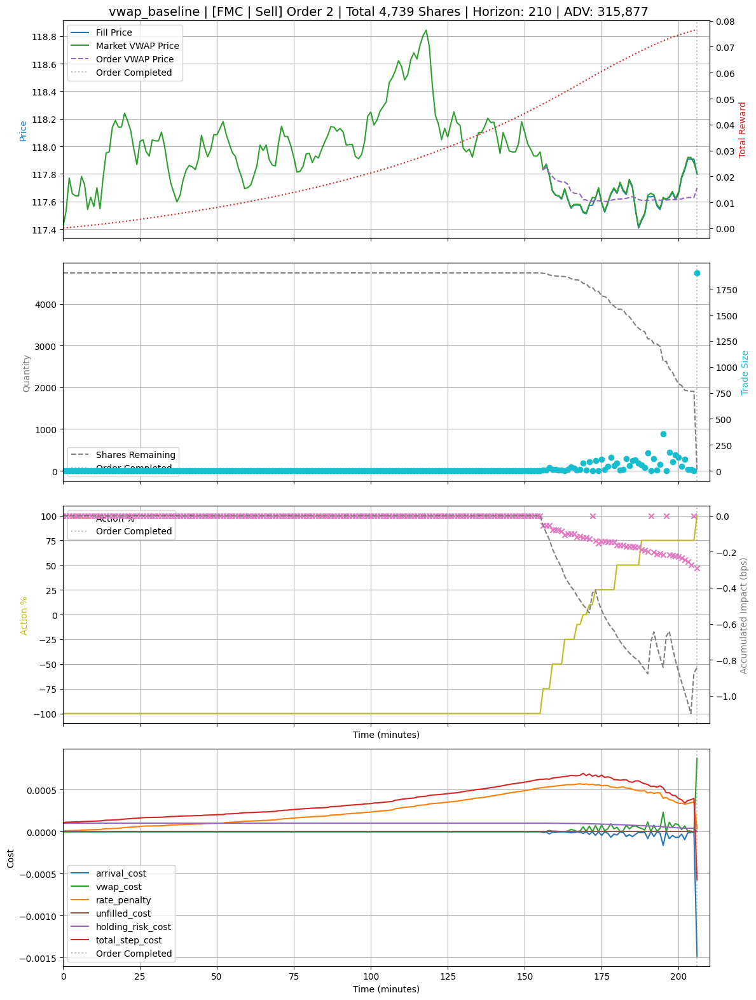

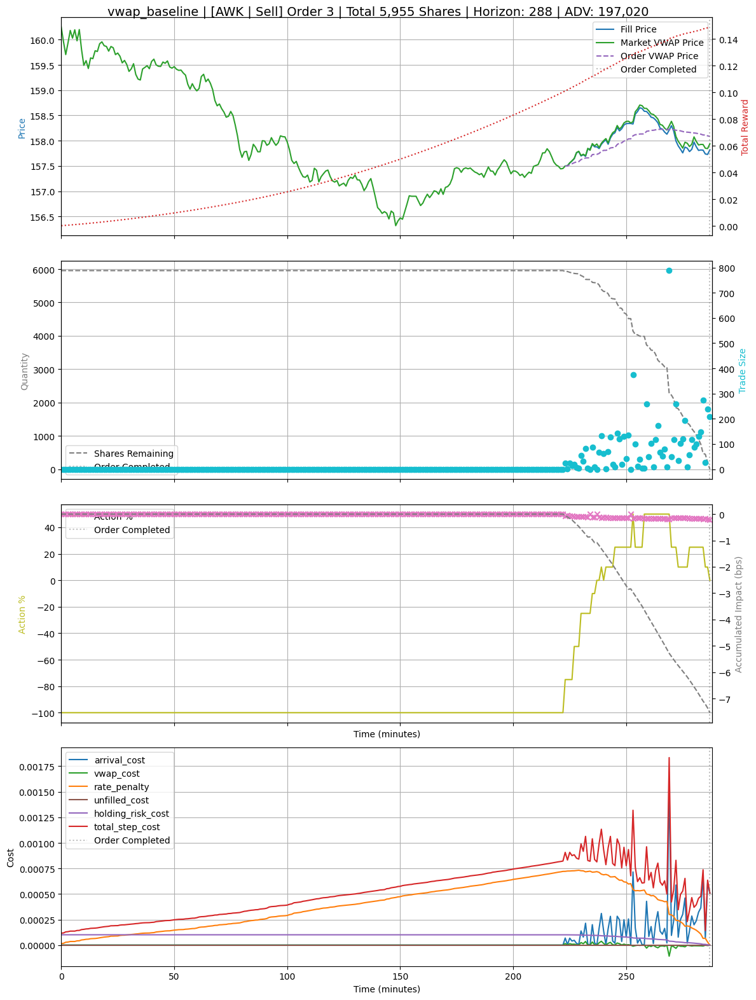


=== Plotting orders for random_baseline ===


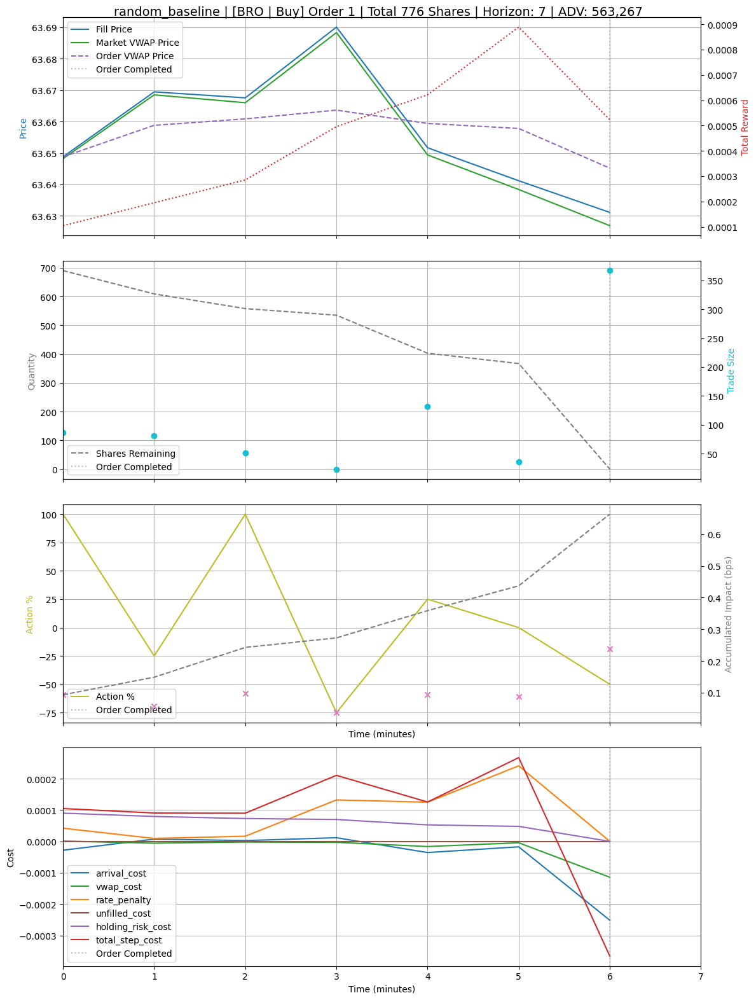

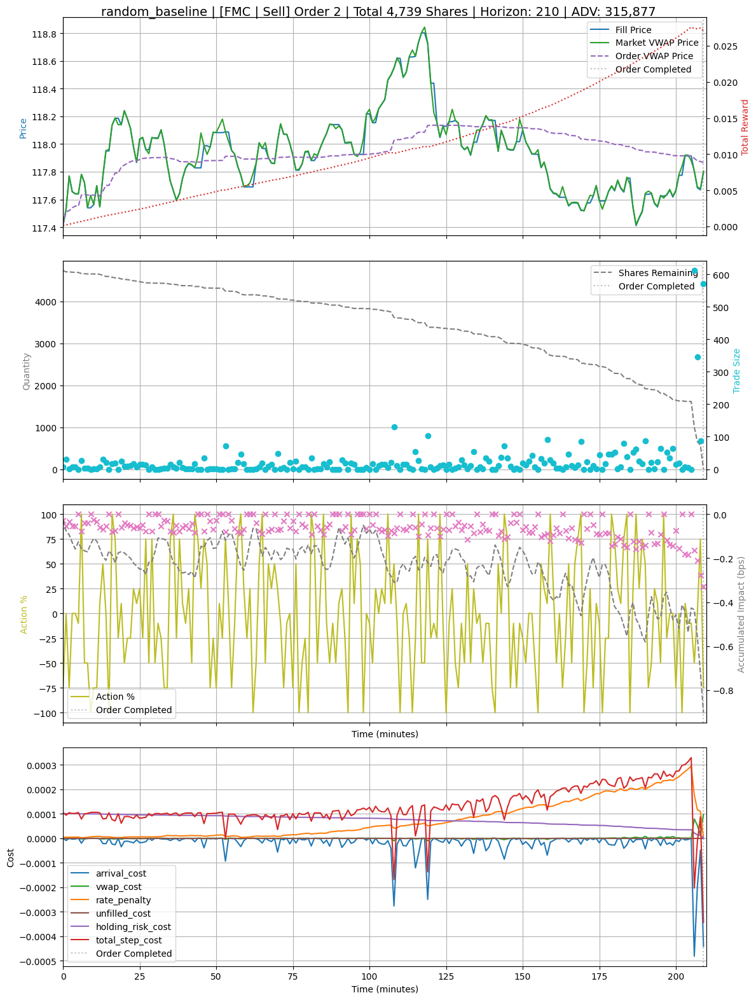

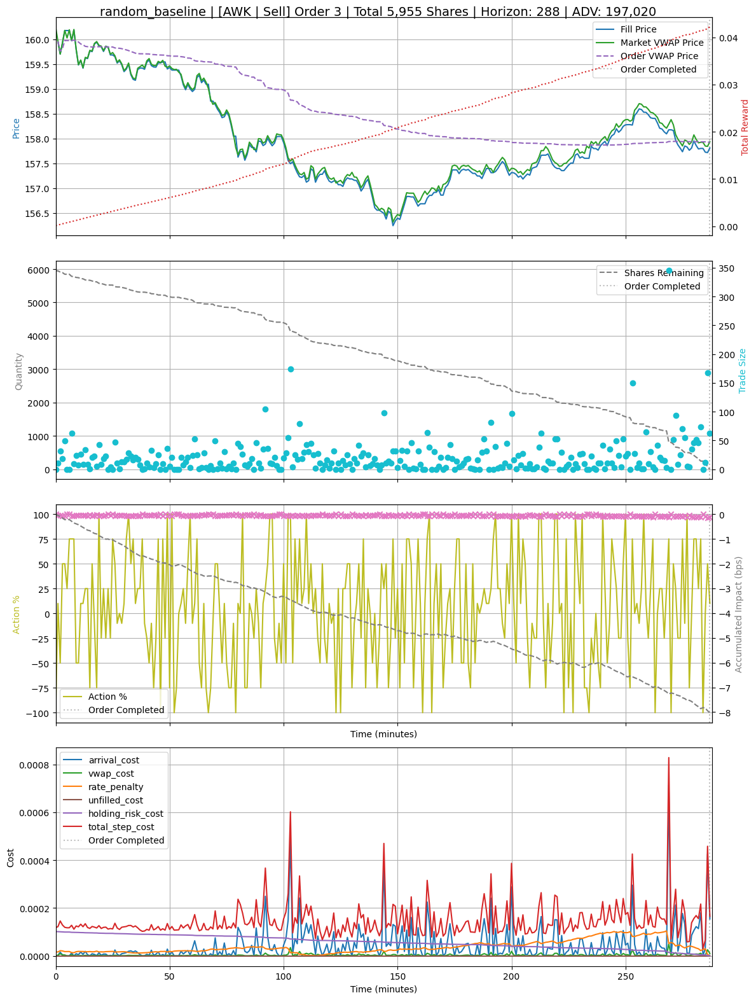


=== Plotting orders for pov_baseline ===


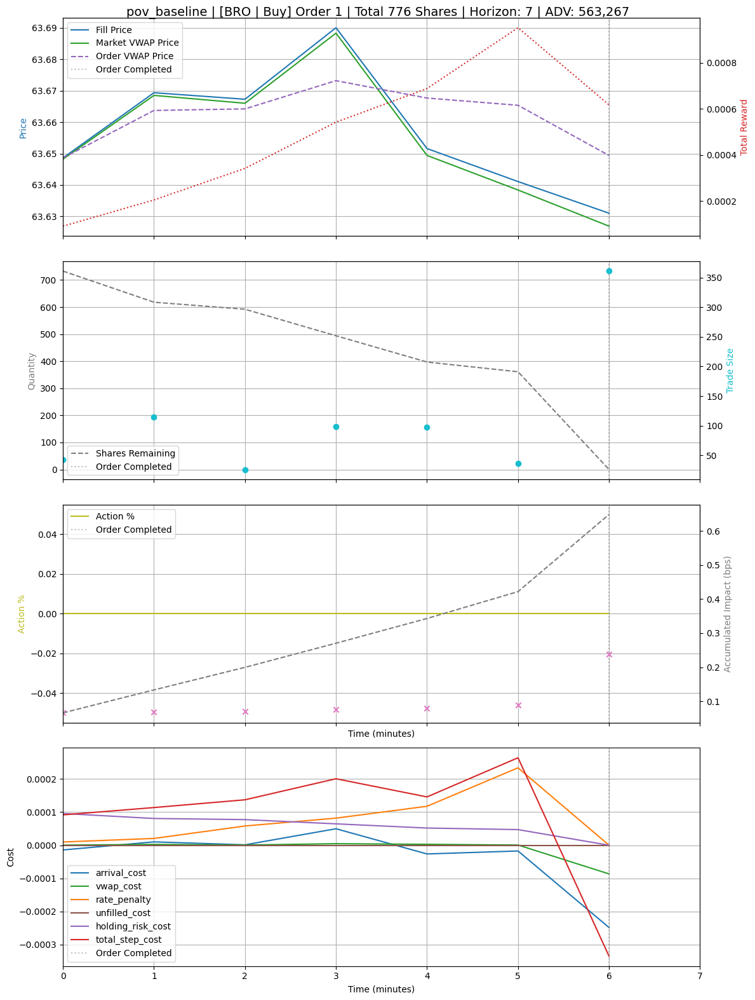

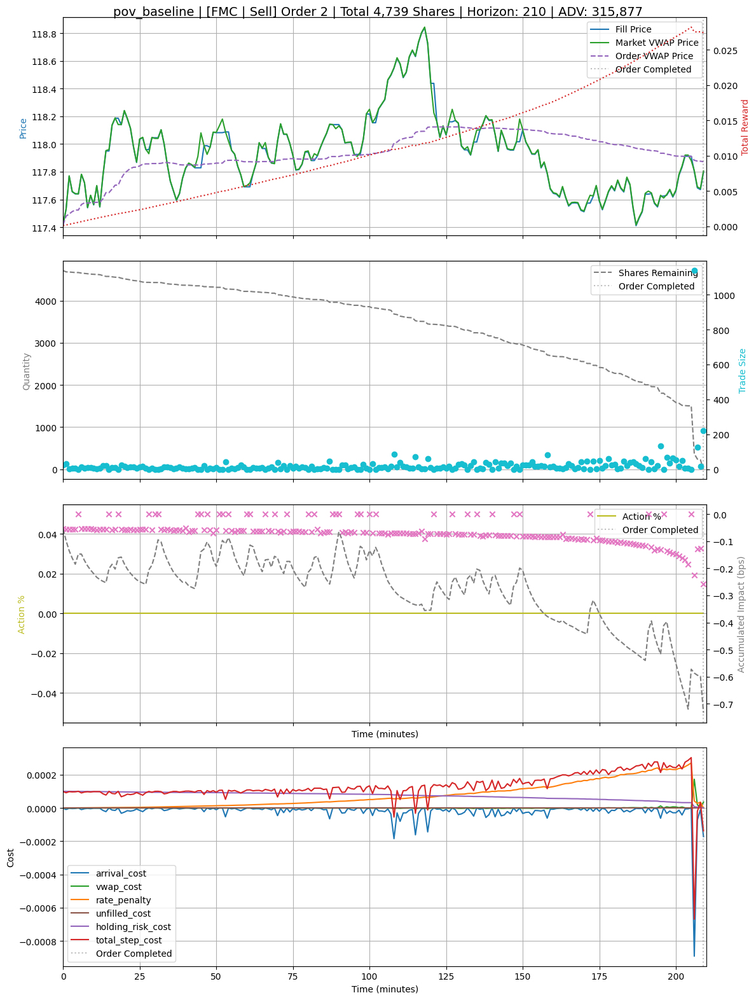

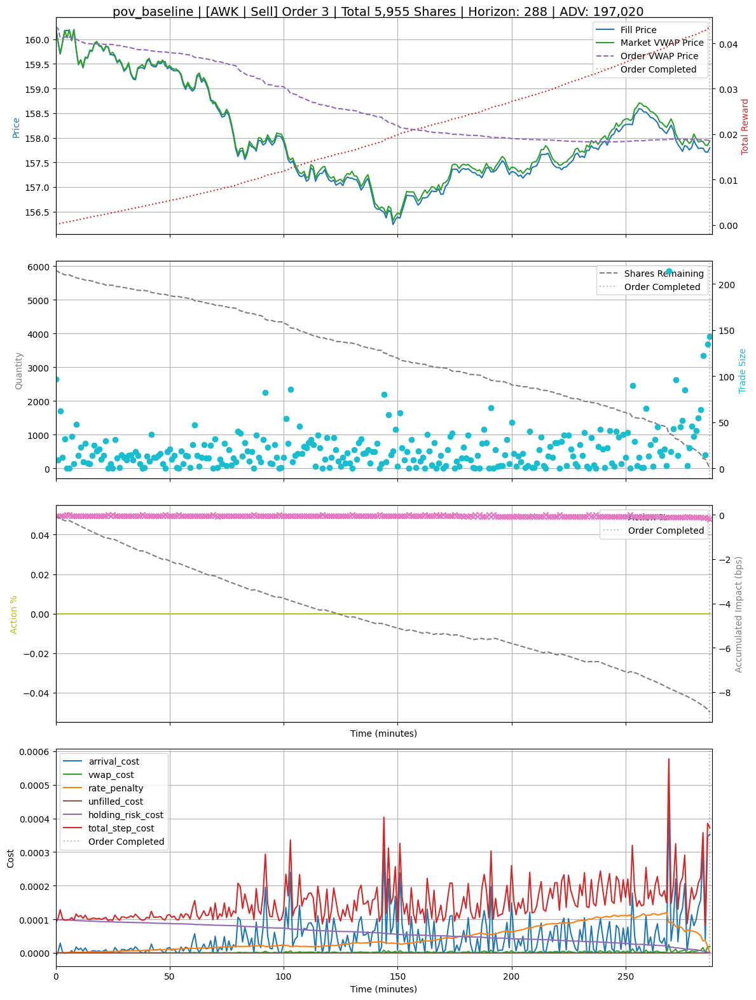


=== Plotting orders for twap_baseline ===


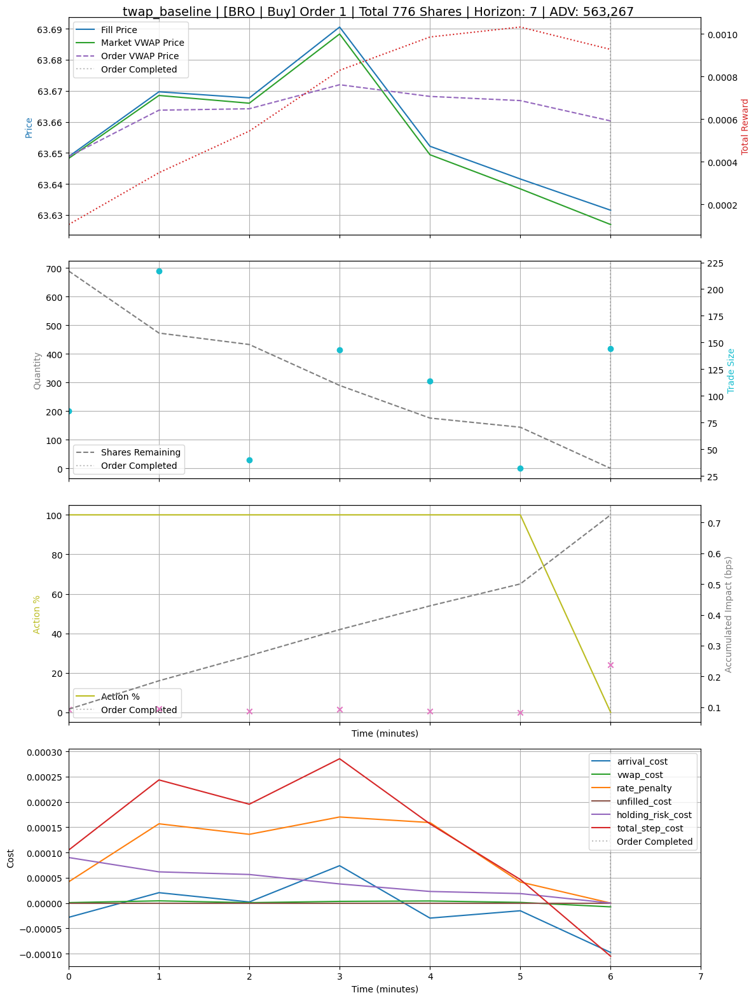

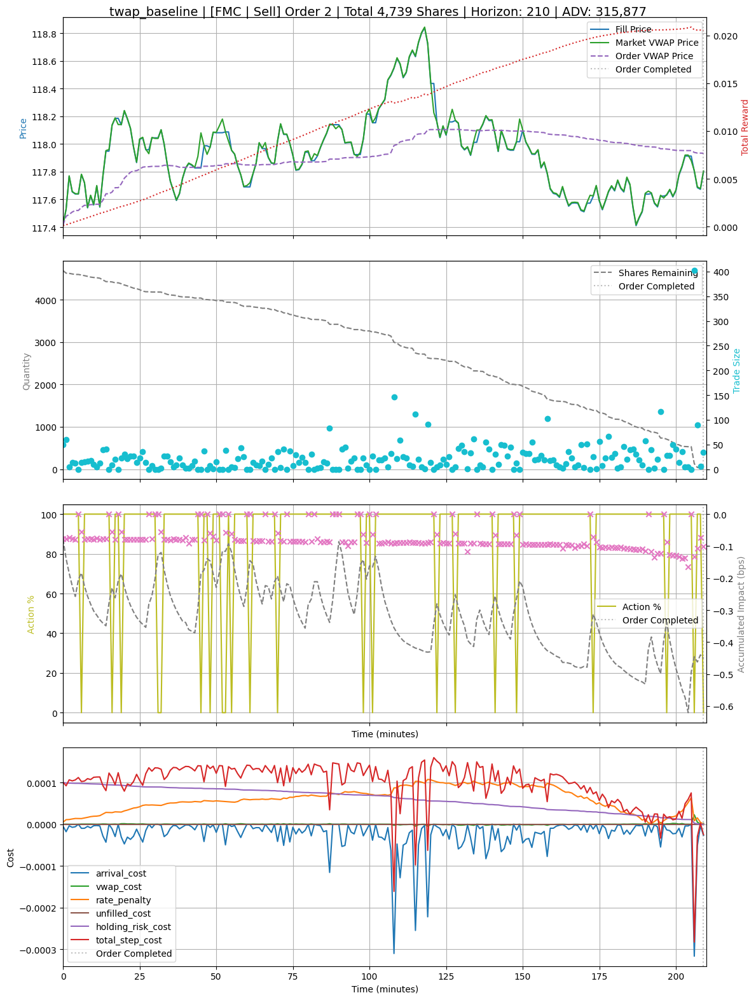

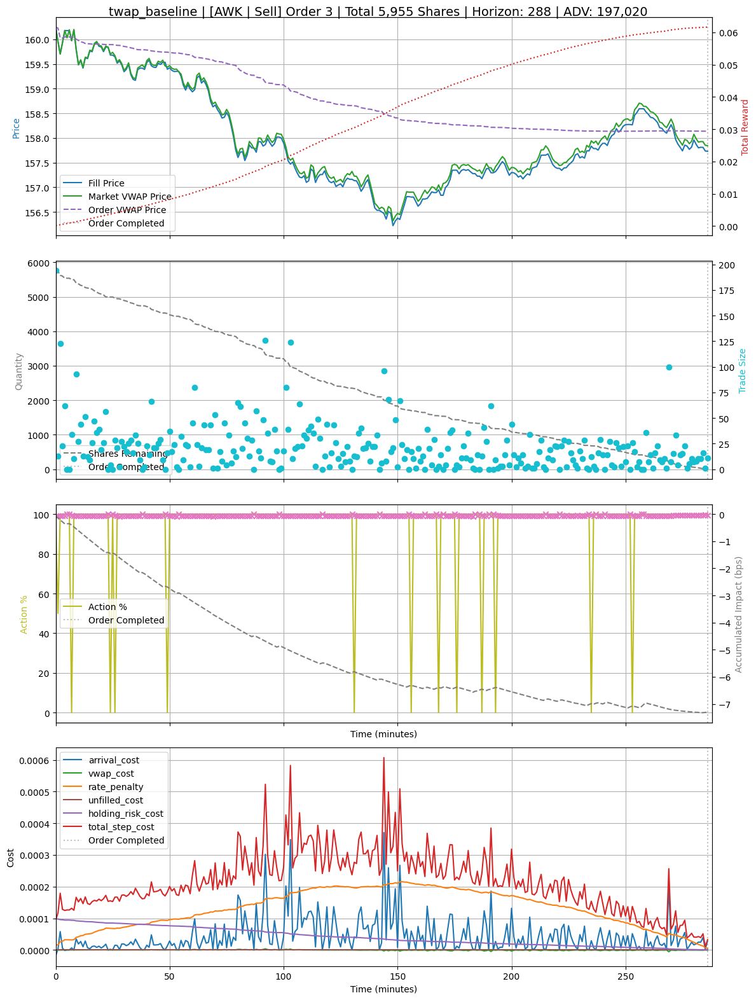


=== Plotting orders for ppo_cnn_cpu_nsteps_2048_batchsize_8192_epochs_3 ===


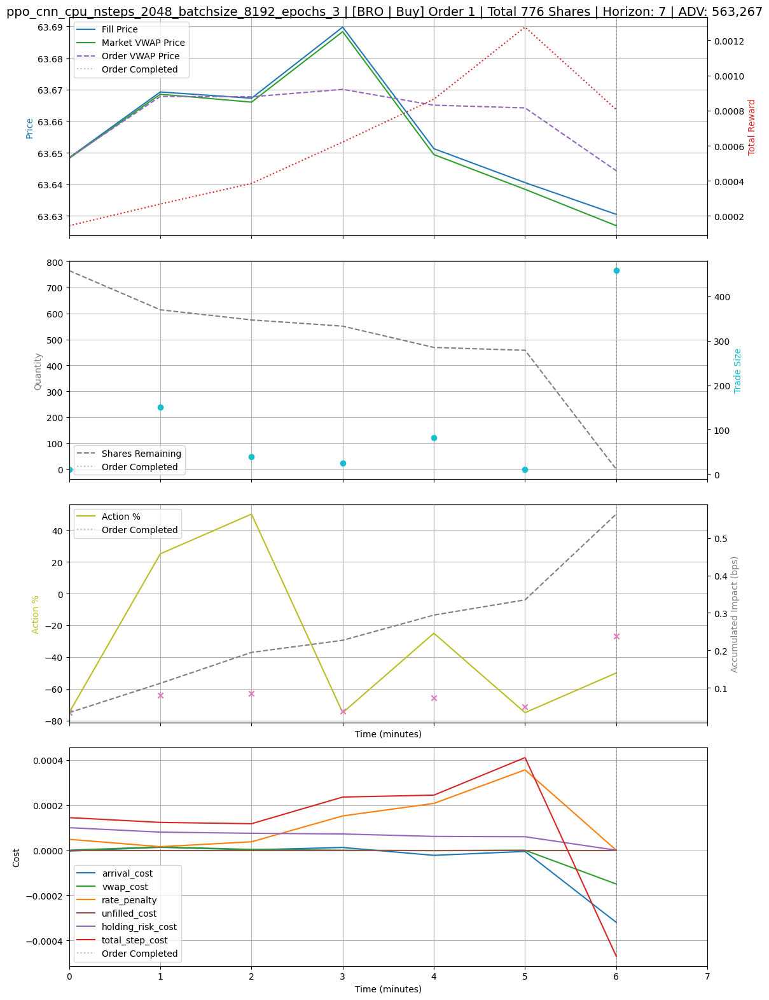

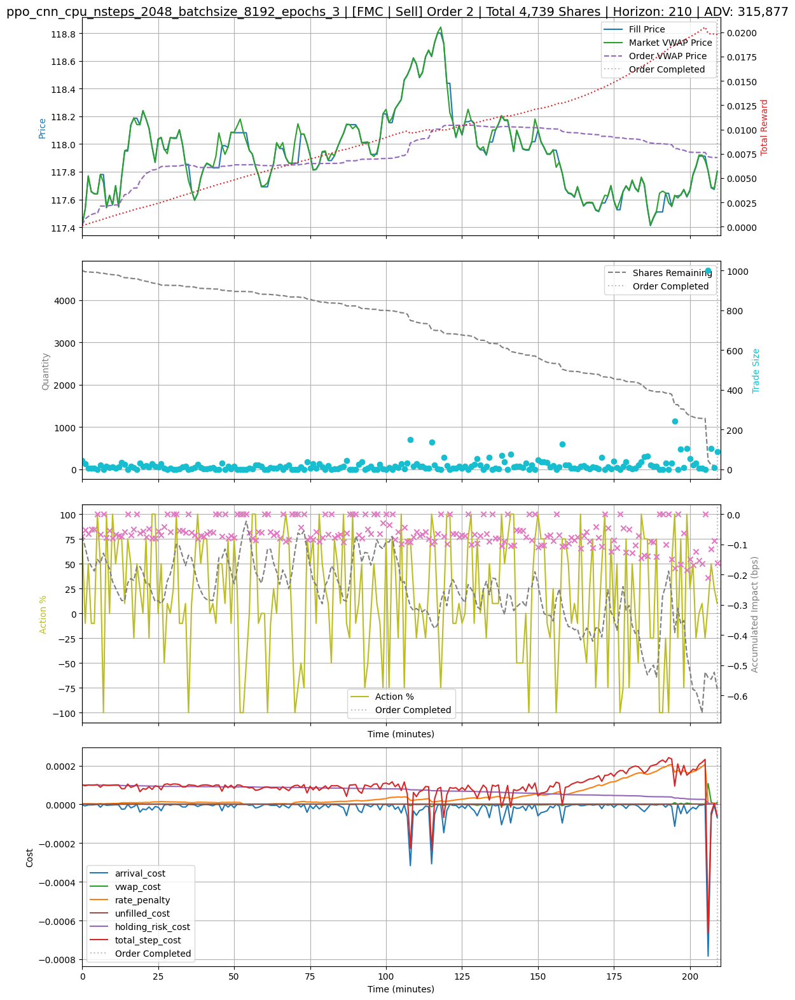

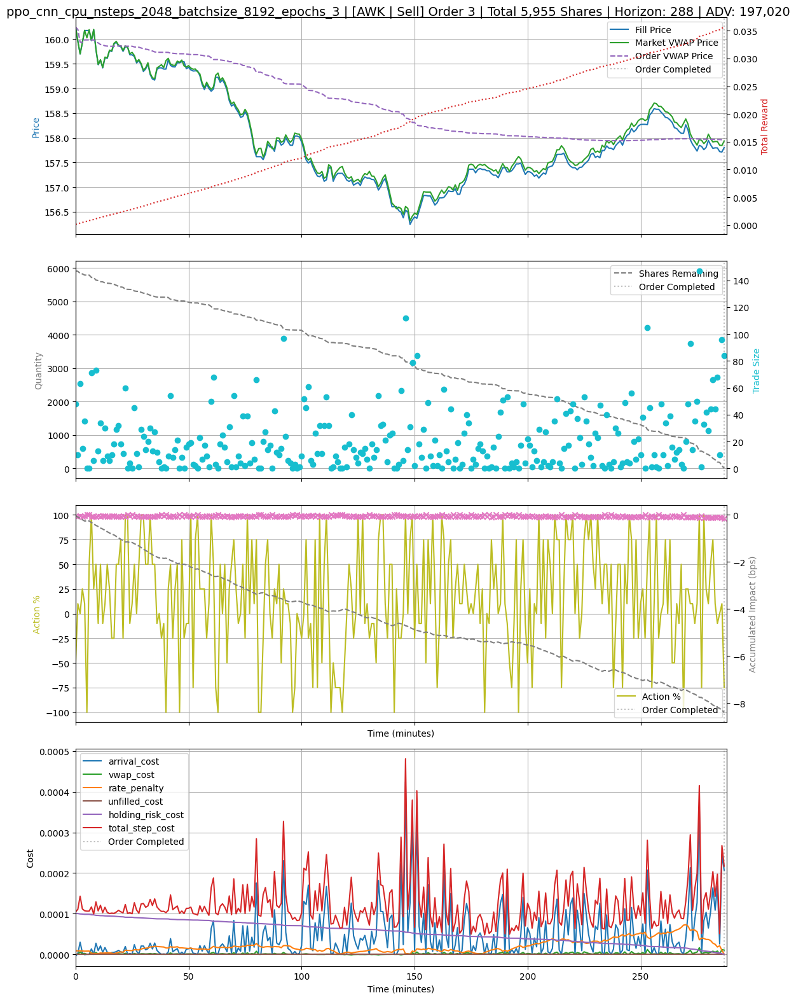


Analysis completed in 55.81 seconds

VECTORIZED PERFORMANCE SUMMARY
Device used: cuda
Total models tested: 6
Episodes per model: 10000
Total episodes executed: 60000
Total execution time: 7087.90 seconds
Average time per episode: 0.1181 seconds
Episodes per second: 8.47

Memory usage:
  Total RAM: 67.1 GB
  Available RAM: 0.8 GB
  Used RAM: 65.5 GB (98.8%)

GPU memory usage:
  Allocated: 1.71 GB
  Cached: 2.27 GB


In [21]:
import gc

gc.collect()

stored_test_orders = tcadm.load_latest()
importlib.reload(rp)
import render_plots as rp

# Vectorized plotting and analysis
print("Generating vectorized analysis...")
start_time = time.time()

# Create comprehensive summary tables
print("\nVectorized Test Environment Results:")
print("="*80)
rp.create_execution_summary_and_plots(stored_test_orders)


# Plot execution results
rp.plot_orders(stored_test_orders, num_orders=3)


analysis_time = time.time() - start_time
print(f"\nAnalysis completed in {analysis_time:.2f} seconds")

# Performance comparison and system metrics
print("\nVECTORIZED PERFORMANCE SUMMARY")
print("="*80)

# Calculate performance metrics
total_episodes = len(model_name_list) * num_episodes
total_execution_time = sum(execution_times.values())
avg_time_per_episode = total_execution_time / total_episodes

print(f"Device used: {device}")
print(f"Total models tested: {len(model_name_list)}")
print(f"Episodes per model: {num_episodes}")
print(f"Total episodes executed: {total_episodes}")
print(f"Total execution time: {total_execution_time:.2f} seconds")
print(f"Average time per episode: {avg_time_per_episode:.4f} seconds")
print(f"Episodes per second: {1/avg_time_per_episode:.2f}")

# Memory usage
memory_info = psutil.virtual_memory()
print(f"\nMemory usage:")
print(f"  Total RAM: {memory_info.total / 1e9:.1f} GB")
print(f"  Available RAM: {memory_info.available / 1e9:.1f} GB")
print(f"  Used RAM: {memory_info.used / 1e9:.1f} GB ({memory_info.percent:.1f}%)")

# GPU memory if available
if device == 'cuda':
    gpu_memory = torch.cuda.memory_allocated() / 1e9
    gpu_memory_cached = torch.cuda.memory_reserved() / 1e9
    print(f"\nGPU memory usage:")
    print(f"  Allocated: {gpu_memory:.2f} GB")
    print(f"  Cached: {gpu_memory_cached:.2f} GB")



In [110]:
import sys

def show_biggest_vars(locals_dict=None, top_n=10):
    """Show the biggest variables by memory usage"""
    if locals_dict is None:
        # Get caller's local variables
        import inspect
        frame = inspect.currentframe().f_back
        locals_dict = frame.f_locals
    
    var_sizes = []
    
    for name, obj in locals_dict.items():
        if not name.startswith('_'):  # Skip private variables
            try:
                size = sys.getsizeof(obj)
                # For containers, get deep size
                if hasattr(obj, '__len__') and hasattr(obj, '__iter__'):
                    if isinstance(obj, (list, tuple, set)):
                        size += sum(sys.getsizeof(item) for item in obj)
                    elif isinstance(obj, dict):
                        size += sum(sys.getsizeof(k) + sys.getsizeof(v) for k, v in obj.items())
                
                var_sizes.append((name, size, type(obj).__name__))
            except (TypeError, RecursionError):
                # Some objects can't be sized
                var_sizes.append((name, 0, type(obj).__name__))
    
    # Sort by size and show top N
    var_sizes.sort(key=lambda x: x[1], reverse=True)
    
    print(f"Top {top_n} memory consuming variables:")
    print("-" * 50)
    for name, size, obj_type in var_sizes[:top_n]:
        if size > 1024*1024:
            print(f"{name:15} {size/1024/1024:8.2f} MB  ({obj_type})")
        elif size > 1024:
            print(f"{name:15} {size/1024:8.2f} KB  ({obj_type})")
        else:
            print(f"{name:15} {size:8.0f} B   ({obj_type})")

# Usage - just call it anywhere in your code:
show_biggest_vars()

# Or check globals instead of locals:
show_biggest_vars(globals())

Top 10 memory consuming variables:
--------------------------------------------------
train_stock_df_list  4177.38 MB  (dict)
test_stock_df_list  1858.27 MB  (dict)
obj              1858.27 MB  (dict)
orders              8.24 MB  (list)
train_orders_df     7.36 MB  (DataFrame)
test_orders_df      4.42 MB  (DataFrame)
stored_test_orders     3.43 MB  (DataFrame)
In                282.54 KB  (list)
test_orders       264.79 KB  (dict)
common_order_indices   175.84 KB  (list)
Top 10 memory consuming variables:
--------------------------------------------------
train_stock_df_list  4177.38 MB  (dict)
test_stock_df_list  1858.27 MB  (dict)
obj              1858.27 MB  (dict)
orders              8.24 MB  (list)
train_orders_df     7.36 MB  (DataFrame)
test_orders_df      4.42 MB  (DataFrame)
stored_test_orders     3.43 MB  (DataFrame)
In                282.54 KB  (list)
test_orders       264.79 KB  (dict)
common_order_indices   175.84 KB  (list)


In [111]:
# free up memory when just executing
del train_stock_df_list
gc.collect()

69255

In [ ]:
To-dos:


Comparison and metric:
* Fix VWAP baseline to use volume profile and execute the full horizon
* Add Almgren-Chriss baseline
* Make volume profiles to scale volume and remove auctions, remove special days
* TODO: fix warnings in generate orders
* TODO: refactor optimal execuion env


**Future Vectorized Optimizations**

To-dos for enhanced vectorized performance:

**Environment Optimizations:**
* Implement true multi-GPU support for larger scale training
* Add mixed precision training for faster convergence
* Implement gradient accumulation for larger effective batch sizes
* Add distributed training support

**Model Optimizations:**
* Implement model quantization for faster inference
* Add model pruning for memory efficiency
* Explore transformer-based architectures
* Implement ensemble methods with vectorized prediction

**Data Pipeline Optimizations:**
* Implement data streaming for larger datasets
* Add data preprocessing on GPU
* Implement efficient data caching
* Add real-time data integration

**Analysis Optimizations:**
* Vectorized metric computation
* GPU-accelerated visualization
* Parallel backtesting framework
* Real-time performance monitoring

The vectorized implementation demonstrates significant performance gains while maintaining the same core functionality and research objectives.
